# EDA

In [ ]:
!pip install wfdb


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.8/163.8 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 90.1 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.3.3 which is incompatible.
cudf-cu12 25.6.0 requires pandas<2.2.4dev0,>=2.0, but you have pandas 2.3.3 which is incompatible.
dask-cudf-cu12 25.6.0 requires pandas<2.2.4dev0,>=2.0, but you have pandas 2.3.3 which is incompatible.


In [ ]:
import pandas as pd
import numpy as np
import wfdb
import ast
from tqdm import tqdm
import warnings; warnings.filterwarnings('ignore')
from IPython.display import display

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

## Load Raw Data

In [ ]:
def load_raw_data(df, sampling_rate, path):
    if sampling_rate == 100:
        data = [wfdb.rdsamp(path+f) for f in tqdm(df.filename_lr)]
    else:
        data = [wfdb.rdsamp(path+f) for f in tqdm(df.filename_hr)]
    data = np.array([signal for signal, meta in data])
    return data

In [ ]:
path = '../input/ptb-xl-dataset/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.1/'
sampling_rate=100

# load and convert annotation data
Y = pd.read_csv(path+'ptbxl_database.csv', index_col='ecg_id')
Y.scp_codes = Y.scp_codes.apply(lambda x: ast.literal_eval(x))

# Load raw signal data
X = load_raw_data(Y, sampling_rate, path)

print('data shpae:', X.shape)
Y[['scp_codes']]
Y

100%|██████████| 21837/21837 [08:28<00:00, 42.93it/s]


data shpae: (21837, 1000, 12)


,patient_id,age,sex,height,weight,nurse,site,device,recording_date,report,...,validated_by_human,baseline_drift,static_noise,burst_noise,electrodes_problems,extra_beats,pacemaker,strat_fold,filename_lr,filename_hr
ecg_id,,,,,,,,,,,,,,,,,,,,,
1,15709.0,56.0,1,NaN,63.0,2.0,0.0,CS-12 E,1984-11-09 09:17:34,sinusrhythmus periphere niederspannung,...,True,NaN,", I-V1,",NaN,NaN,NaN,NaN,3,records100/00000/00001_lr,records500/00000/00001_hr
2,13243.0,19.0,0,NaN,70.0,2.0,0.0,CS-12 E,1984-11-14 12:55:37,sinusbradykardie sonst normales ekg,...,True,NaN,NaN,NaN,NaN,NaN,NaN,2,records100/00000/00002_lr,records500/00000/00002_hr
3,20372.0,37.0,1,NaN,69.0,2.0,0.0,CS-12 E,1984-11-15 12:49:10,sinusrhythmus normales ekg,...,True,NaN,NaN,NaN,NaN,NaN,NaN,5,records100/00000/00003_lr,records500/00000/00003_hr
4,17014.0,24.0,0,NaN,82.0,2.0,0.0,CS-12 E,1984-11-15 13:44:57,sinusrhythmus normales ekg,...,True,", II,III,AVF",NaN,NaN,NaN,NaN,NaN,3,records100/00000/00004_lr,records500/00000/00004_hr
5,17448.0,19.0,1,NaN,70.0,2.0,0.0,CS-12 E,1984-11-17 10:43:15,sinusrhythmus normales ekg,...,True,", III,AVR,AVF",NaN,NaN,NaN,NaN,NaN,4,records100/00000/00005_lr,records500/00000/00005_hr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21833,17180.0,67.0,1,NaN,NaN,1.0,2.0,AT-60 3,2001-05-31 09:14:35,ventrikulÄre extrasystole(n) sinustachykardie ...,...,True,NaN,", alles,",NaN,NaN,1ES,NaN,7,records100/21000/21833_lr,records500/21000/21833_hr
21834,20703.0,93.0,0,NaN,NaN,1.0,2.0,AT-60 3,2001-06-05 11:33:39,sinusrhythmus lagetyp normal qrs(t) abnorm ...,...,True,NaN,NaN,NaN,NaN,NaN,NaN,4,records100/21000/21834_lr,records500/21000/21834_hr
21835,19311.0,59.0,1,NaN,NaN,1.0,2.0,AT-60 3,2001-06-08 10:30:27,sinusrhythmus lagetyp normal t abnorm in anter...,...,True,NaN,", I-AVR,",NaN,NaN,NaN,NaN,2,records100/21000/21835_lr,records500/21000/21835_hr


## Load Data for Heart Beat Diagnostic

In [ ]:
# Load scp_statements.csv for diagnostic aggregation
agg_df = pd.read_csv(path+'scp_statements.csv', index_col=0)
agg_df = agg_df[agg_df.diagnostic == 1]
print(agg_df.shape)
agg_df.head()

(44, 12)


,description,diagnostic,form,rhythm,diagnostic_class,diagnostic_subclass,Statement Category,SCP-ECG Statement Description,AHA code,aECG REFID,CDISC Code,DICOM Code
NDT,non-diagnostic T abnormalities,1.0,1.0,NaN,STTC,STTC,other ST-T descriptive statements,non-diagnostic T abnormalities,NaN,NaN,NaN,NaN
NST_,non-specific ST changes,1.0,1.0,NaN,STTC,NST_,Basic roots for coding ST-T changes and abnorm...,non-specific ST changes,145.0,MDC_ECG_RHY_STHILOST,NaN,NaN
DIG,digitalis-effect,1.0,1.0,NaN,STTC,STTC,other ST-T descriptive statements,suggests digitalis-effect,205.0,NaN,NaN,NaN
LNGQT,long QT-interval,1.0,1.0,NaN,STTC,STTC,other ST-T descriptive statements,long QT-interval,148.0,NaN,NaN,NaN
NORM,normal ECG,1.0,NaN,NaN,NORM,NORM,Normal/abnormal,normal ECG,1.0,NaN,NaN,F-000B7


In [ ]:
def aggregate_supclass_diagnostic(y_dic):
    tmp = []
    for key in y_dic.keys():
        if key in agg_df.index:
            tmp.append(agg_df.loc[key].diagnostic_class)
    return list(set(tmp))

# Apply diagnostic superclass
Y['diagnostic_superclass'] = Y.scp_codes.apply(aggregate_supclass_diagnostic)
Y['diagnostic_superclass_len'] = Y['diagnostic_superclass'].apply(len)
Y.loc[Y.diagnostic_superclass_len > 1, 'diagnostic_superclass']

ecg_id
39       [STTC, MI]
45        [HYP, CD]
50         [CD, MI]
77         [CD, MI]
87       [STTC, CD]
            ...    
21815      [CD, MI]
21821    [NORM, CD]
21827    [STTC, MI]
21828    [STTC, MI]
21829    [NORM, CD]
Name: diagnostic_superclass, Length: 5158, dtype: object

### Number of Superclass per ECG record

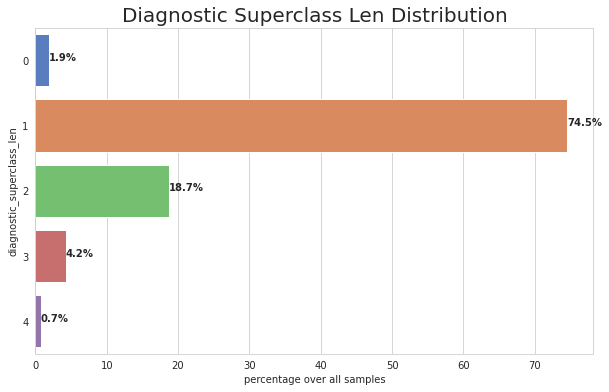

In [ ]:
vc = Y['diagnostic_superclass_len'].value_counts()

sns.set_style("whitegrid")
bar,ax = plt.subplots(figsize=(10,6))
ax = sns.barplot(x=vc.values/vc.values.sum()*100., y=vc.index, ci=None, palette="muted",orient='h' )
ax.set_title("Diagnostic Superclass Len Distribution", fontsize=20)
ax.set_xlabel ("percentage over all samples")
ax.set_ylabel ("diagnostic_superclass_len")
for rect in ax.patches:
    ax.text (rect.get_width(), rect.get_y() + rect.get_height() / 2,"%.1f%%"% rect.get_width(), weight='bold' )

> There could be up to 4 super class for the same ecg record!

#### Meaning of Superclassses
* NORM: Normal ECG
* MI:   Myocardial Infarction, a myocardial infarction (MI), commonly known as a heart attack, occurs when blood flow decreases or stops to a part of the heart, causing damage to the heart muscle [Reference](https://en.wikipedia.org/wiki/Myocardial_infarction)
* STTC: ST/T Change, ST and T wave changes may represent cardiac pathology or be a normal variant. Interpretation of the findings, therefore, depends on the clinical context and presence of similar findings on prior electrocardiograms.[Reference](https://www.uptodate.com/contents/ecg-tutorial-st-and-t-wave-changes)
* CD:   Conduction Disturbance. Your heart rhythm is the way your heart beats. Conduction is how electrical impulses travel through your heart, which causes it to beat. Some conduction disorders can cause arrhythmias, or irregular heartbeats. [Reference](https://www.heart.org/en/health-topics/arrhythmia/about-arrhythmia/conduction-disorders)
* HYP:  Hypertrophy, Hypertrophic cardiomyopathy (HCM) is a disease in which the heart muscle becomes abnormally thick (hypertrophied). The thickened heart muscle can make it harder for the heart to pump blood. [Reference](https://www.mayoclinic.org/diseases-conditions/hypertrophic-cardiomyopathy/symptoms-causes/syc-20350198)

### Number of Subclass per ECG record

In [ ]:
def aggregate_subclass_diagnostic(y_dic):
    tmp = []
    for key in y_dic.keys():
        if key in agg_df.index:
            tmp.append(agg_df.loc[key].diagnostic_subclass)
    ret = list(set(tmp))
    ret = ['sub_'+r for r in ret] # to distinguish between subclass and superclass columns
    return ret

# Apply diagnostic subclass
Y['diagnostic_subclass'] = Y.scp_codes.apply(aggregate_subclass_diagnostic)
Y['diagnostic_subclass_len'] = Y['diagnostic_subclass'].apply(len)
Y.loc[Y.diagnostic_subclass_len > 1, 'diagnostic_subclass']

ecg_id
26                    [sub_NST_, sub_STTC]
28                    [sub_NST_, sub_STTC]
39           [sub_IMI, sub_NST_, sub_STTC]
45       [sub_RVH, sub_RAO/RAE, sub_IRBBB]
50                     [sub_IVCD, sub_LMI]
                       ...                
21821                [sub_NORM, sub_IRBBB]
21827                  [sub_IMI, sub_ISCA]
21828                  [sub_IMI, sub_ISCA]
21829                [sub_NORM, sub_IRBBB]
21832            [sub_IVCD, sub_LAFB/LPFB]
Name: diagnostic_subclass, Length: 6191, dtype: object

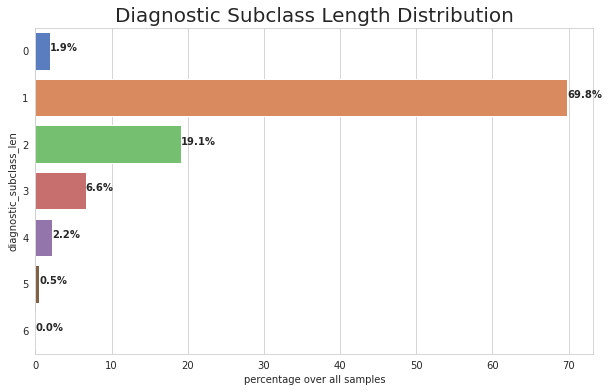

In [ ]:
vc = Y['diagnostic_subclass_len'].value_counts()

sns.set_style("whitegrid")
bar,ax = plt.subplots(figsize=(10,6))
ax = sns.barplot(x=vc.values/vc.values.sum()*100., y=vc.index, ci=None, palette="muted",orient='h' )
ax.set_title("Diagnostic Subclass Length Distribution", fontsize=20)
ax.set_xlabel ("percentage over all samples")
ax.set_ylabel ("diagnostic_subclass_len")
for rect in ax.patches:
    ax.text (rect.get_width(), rect.get_y() + rect.get_height() / 2,"%.1f%%"% rect.get_width(), weight='bold' )

> There could be up to 6 sub class for the same ecg record!

In [ ]:
Y.columns.tolist()

['patient_id',
 'age',
 'sex',
 'height',
 'weight',
 'nurse',
 'site',
 'device',
 'recording_date',
 'report',
 'scp_codes',
 'heart_axis',
 'infarction_stadium1',
 'infarction_stadium2',
 'validated_by',
 'second_opinion',
 'initial_autogenerated_report',
 'validated_by_human',
 'baseline_drift',
 'static_noise',
 'burst_noise',
 'electrodes_problems',
 'extra_beats',
 'pacemaker',
 'strat_fold',
 'filename_lr',
 'filename_hr',
 'diagnostic_superclass',
 'diagnostic_superclass_len',
 'diagnostic_subclass',
 'diagnostic_subclass_len']

## Reformat Data for EDA

In [ ]:
all_superclass = pd.Series(np.concatenate(Y['diagnostic_superclass'].values))
all_subclass = pd.Series(np.concatenate(Y['diagnostic_subclass'].values))
superclass_cols = all_superclass.unique()
subclass_cols = all_subclass.unique()
update_cols = np.concatenate([superclass_cols, subclass_cols]) # add meta data columns
meta_cols = ['age', 'sex', 'height', 'weight', 'nurse', 'site', 'device',] # could add more columns as features

In [ ]:
class ClassUpdate():
    def __init__(self, cols):
        self.cols = cols

    def __call__(self, row):
        for sc in row['diagnostic_superclass']:
            row[sc] = 1
        for sc in row['diagnostic_subclass']:
            row[sc] = 1

        return row

def get_data_by_folds(folds, x, y, update_cols, feature_cols):
    assert len(folds)  > 0, '# of provided folds should longer than 1'
    #print(y.strat_fold)
    filt = np.isin(y.strat_fold.values, folds)
    x_selected = x[filt]
    y_selected = y[filt]

    for sc in update_cols:
        y_selected[sc] = 0

    cls_updt = ClassUpdate(update_cols)

    y_selected = y_selected.apply(cls_updt, axis=1)

    return x_selected, y_selected[list(feature_cols)+list(update_cols)+['strat_fold']]

In [ ]:
x_all, y_all = get_data_by_folds(np.arange(1, 11), X, Y, update_cols, meta_cols)

In [ ]:
y_all

,age,sex,height,weight,nurse,site,device,NORM,MI,STTC,...,sub_ISC_,sub_SEHYP,sub_ISCI,sub_CRBBB,sub_CLBBB,sub_LAO/LAE,sub_ILBBB,sub_WPW,sub_PMI,strat_fold
ecg_id,,,,,,,,,,,,,,,,,,,,,
1,56.0,1,NaN,63.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,3
2,19.0,0,NaN,70.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,2
3,37.0,1,NaN,69.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,5
4,24.0,0,NaN,82.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,3
5,19.0,1,NaN,70.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21833,67.0,1,NaN,NaN,1.0,2.0,AT-60 3,0,0,1,...,0,0,0,0,0,0,0,0,0,7
21834,93.0,0,NaN,NaN,1.0,2.0,AT-60 3,1,0,0,...,0,0,0,0,0,0,0,0,0,4
21835,59.0,1,NaN,NaN,1.0,2.0,AT-60 3,0,0,1,...,0,0,0,0,0,0,0,0,0,2


### Superclass Distribution

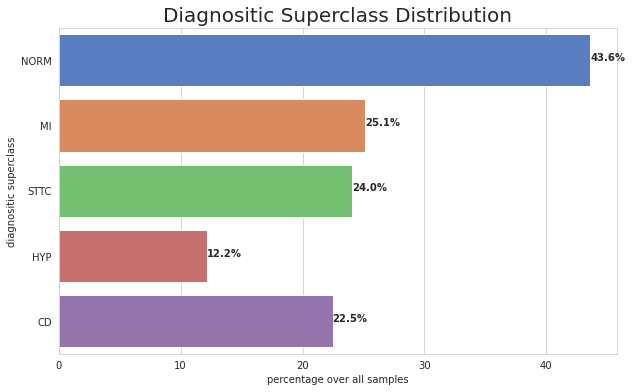

In [ ]:
vc = y_all[superclass_cols].sum(axis=0)

sns.set_style("whitegrid")
bar,ax = plt.subplots(figsize=(10,6))
ax = sns.barplot(x=vc.values/y_all.shape[0]*100., y=vc.index, ci=None, palette="muted",orient='h' )
ax.set_title("Diagnositic Superclass Distribution", fontsize=20)
ax.set_xlabel ("percentage over all samples")
ax.set_ylabel ("diagnositic superclass")
for rect in ax.patches:
    ax.text (rect.get_width(), rect.get_y() + rect.get_height() / 2,"%.1f%%"% rect.get_width(), weight='bold' )

### Subclass Distribution

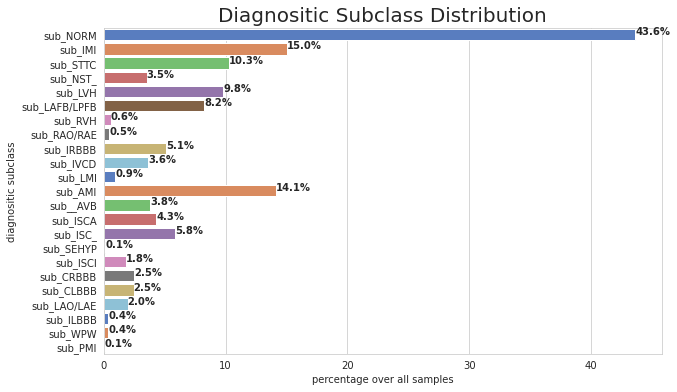

In [ ]:
vc = y_all[subclass_cols].sum(axis=0)

sns.set_style("whitegrid")
bar,ax = plt.subplots(figsize=(10,6))
ax = sns.barplot(x=vc.values/y_all.shape[0]*100., y=vc.index, ci=None, palette="muted",orient='h' )
ax.set_title("Diagnositic Subclass Distribution", fontsize=20)
ax.set_xlabel ("percentage over all samples")
ax.set_ylabel ("diagnositic subclass")
for rect in ax.patches:
    ax.text (rect.get_width(), rect.get_y() + rect.get_height() / 2,"%.1f%%"% rect.get_width(), weight='bold' )

### Subclass Distribution of each Superclass

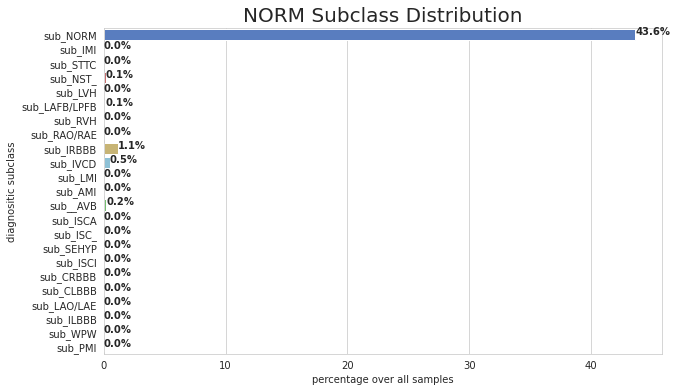

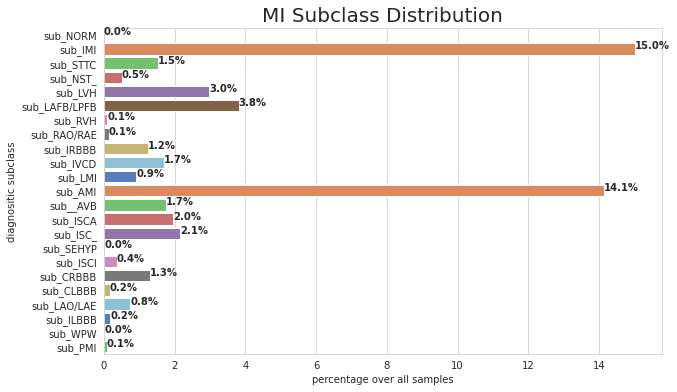

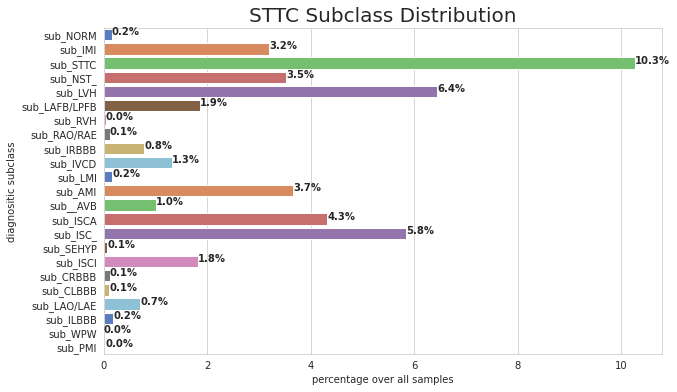

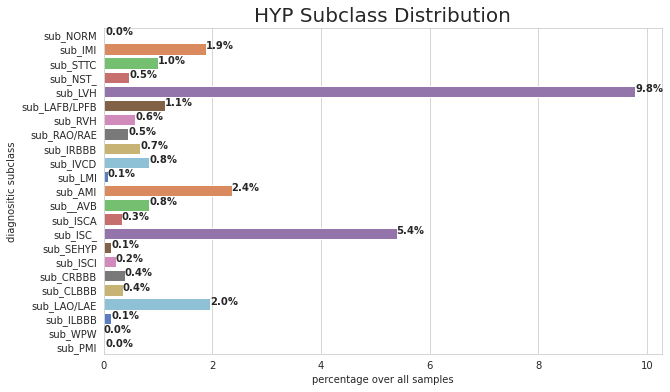

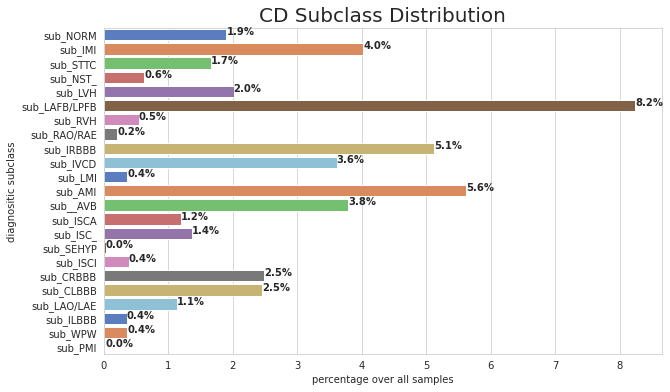

In [ ]:
for superclass in superclass_cols:

    vc = y_all.loc[y_all[superclass] == 1][subclass_cols].sum(axis=0)

    sns.set_style("whitegrid")
    bar,ax = plt.subplots(figsize=(10,6))
    ax = sns.barplot(x=vc.values/y_all.shape[0]*100., y=vc.index, ci=None, palette="muted",orient='h' )
    ax.set_title("{} Subclass Distribution".format(superclass), fontsize=20)
    ax.set_xlabel ("percentage over all samples")
    ax.set_ylabel ("diagnositic subclass")
    for rect in ax.patches:
        ax.text (rect.get_width(), rect.get_y() + rect.get_height() / 2,"%.1f%%"% rect.get_width(), weight='bold' )

In [ ]:
meta_cols

['age', 'sex', 'height', 'weight', 'nurse', 'site', 'device']

### Per Superclass Age Distribution

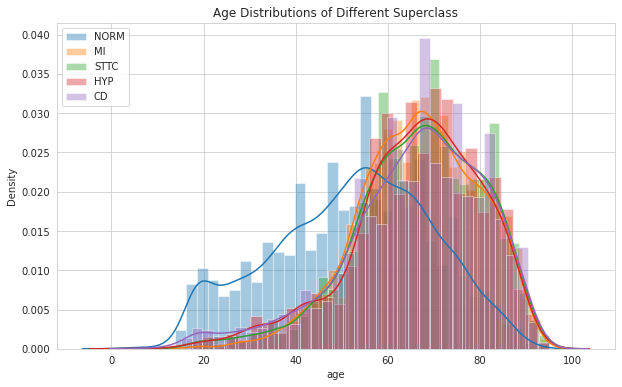

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
plt.title('Age Distributions of Different Superclass')

for superclass in superclass_cols:
    data = y_all.loc[y_all[superclass] == 1]['age']
    sns.distplot(data, label=superclass)


plt.legend(loc='upper left')
plt.show()

### Per Superclass Height Distribution

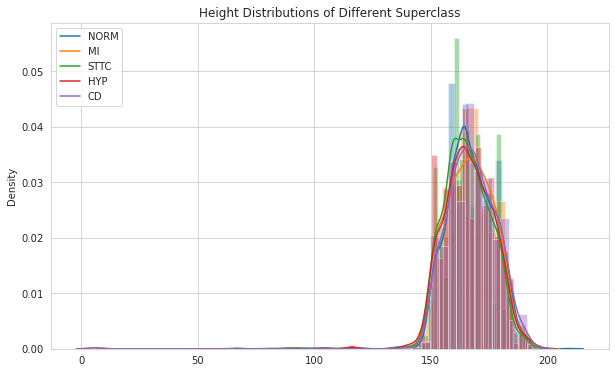

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
plt.title('Height Distributions of Different Superclass')

for superclass in superclass_cols:
    data = y_all.loc[y_all[superclass] == 1][['height']]
    sns.distplot(data, label=superclass)

plt.legend(labels=superclass_cols, loc='upper left')
plt.show()

### Per Superclass Weight Distribution

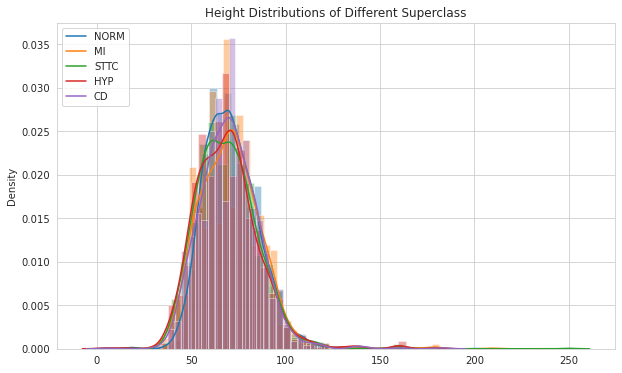

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
plt.title('Height Distributions of Different Superclass')

for superclass in superclass_cols:
    data = y_all.loc[y_all[superclass] == 1][['weight']]
    sns.distplot(data, label=superclass)

plt.legend(labels=superclass_cols, loc='upper left')
plt.show()

### Per Sex Superclass Distribution

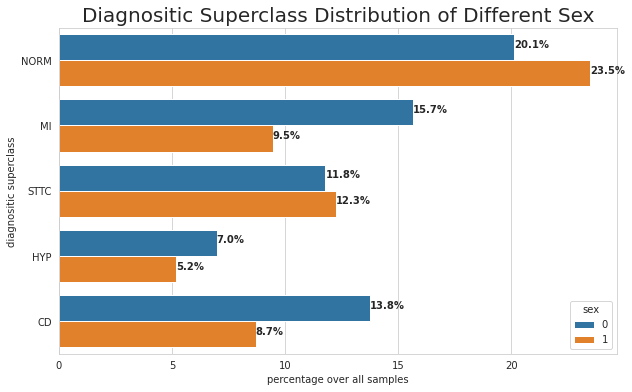

In [ ]:
sns.set_style("whitegrid")
bar,ax = plt.subplots(figsize=(10,6))

ax.set_title("Diagnositic Superclass Distribution of Different Sex", fontsize=20)

all_index, all_count, all_values = [], [], []
for sex in y_all.sex.unique():
    vc = y_all.loc[y_all.sex == sex][superclass_cols].sum(axis=0)
    all_index += list(vc.index)
    all_count += list(vc.values/y_all.shape[0]*100.)
    all_values += [sex]*len(vc)
    #print(all_sex)

df = pd.DataFrame()
df['diagnositic superclass'] = all_index
df['percentage over all samples'] = all_count
df['sex'] = all_values

ax = sns.barplot(data=df, x="percentage over all samples", y="diagnositic superclass", hue="sex",ci=None, orient='h')
for rect in ax.patches:
    ax.text (rect.get_width(), rect.get_y() + rect.get_height() / 2,"%.1f%%"% rect.get_width(), weight='bold')

### Per Nurse Superclass Distribution

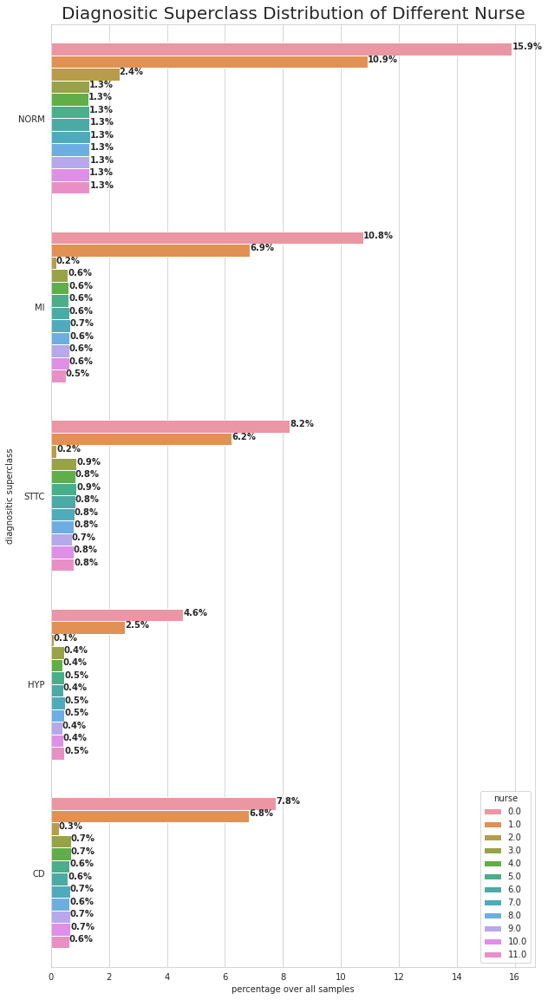

In [ ]:
sns.set_style("whitegrid")
bar,ax = plt.subplots(figsize=(10,20))

ax.set_title("Diagnositic Superclass Distribution of Different Nurse", fontsize=20)

all_index, all_count, all_values = [], [], []
for nurse in y_all.nurse.unique():
    vc = y_all.loc[y_all.nurse == nurse][superclass_cols].sum(axis=0)
    all_index += list(vc.index)
    all_count += list(vc.values/y_all.shape[0]*100.)
    all_values += [nurse]*len(vc)
    #print(all_sex)

df = pd.DataFrame()
df['diagnositic superclass'] = all_index
df['percentage over all samples'] = all_count
df['nurse'] = all_values

ax = sns.barplot(data=df, x="percentage over all samples", y="diagnositic superclass", hue="nurse",ci=None, orient='h')
for rect in ax.patches:
    ax.text (rect.get_width(), rect.get_y() + rect.get_height() / 2,"%.1f%%"% rect.get_width(), weight='bold')

### Per Site Superclass Distribution

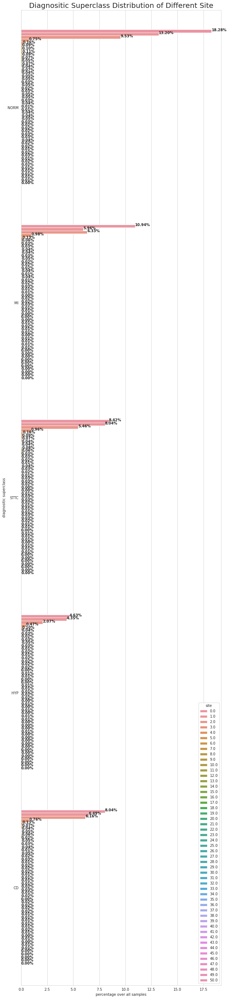

In [ ]:
sns.set_style("whitegrid")
bar,ax = plt.subplots(figsize=(10,50))

ax.set_title("Diagnositic Superclass Distribution of Different Site", fontsize=20)

all_index, all_count, all_values = [], [], []
for site in y_all.site.unique():
    vc = y_all.loc[y_all.site == site][superclass_cols].sum(axis=0)
    all_index += list(vc.index)
    all_count += list(vc.values/y_all.shape[0]*100.)
    all_values += [site]*len(vc)
    #print(all_sex)

df = pd.DataFrame()
df['diagnositic superclass'] = all_index
df['percentage over all samples'] = all_count
df['site'] = all_values

ax = sns.barplot(data=df, x="percentage over all samples", y="diagnositic superclass", hue="site",ci=None, orient='h')
for rect in ax.patches:
    ax.text (rect.get_width(), rect.get_y() + rect.get_height() / 2,"%.2f%%"% rect.get_width(), weight='bold')

### Per Device Superclass Distribution

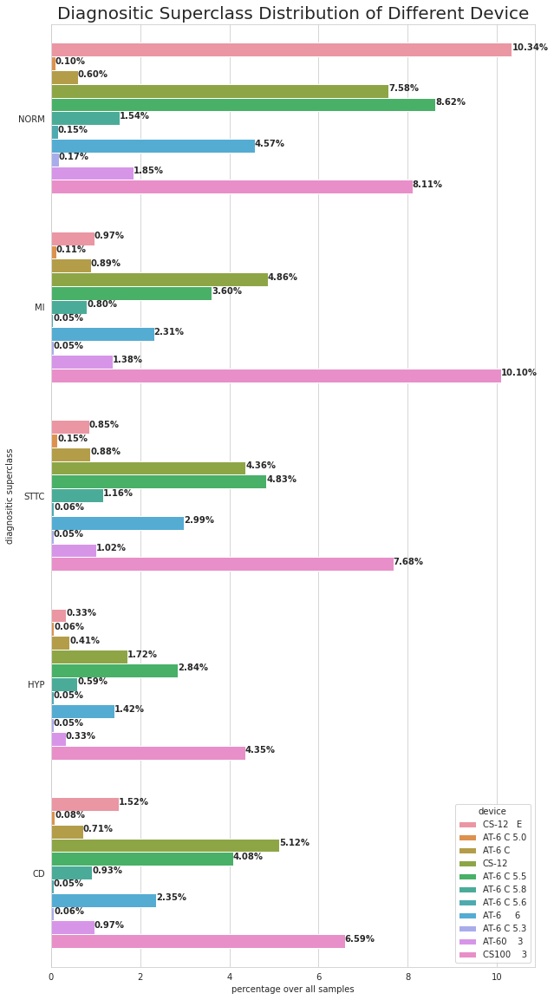

In [ ]:
sns.set_style("whitegrid")
bar,ax = plt.subplots(figsize=(10,20))

ax.set_title("Diagnositic Superclass Distribution of Different Device", fontsize=20)

all_index, all_count, all_values = [], [], []
for device in y_all.device.unique():
    vc = y_all.loc[y_all.device == device][superclass_cols].sum(axis=0)
    all_index += list(vc.index)
    all_count += list(vc.values/y_all.shape[0]*100.)
    all_values += [device]*len(vc)
    #print(all_sex)

df = pd.DataFrame()
df['diagnositic superclass'] = all_index
df['percentage over all samples'] = all_count
df['device'] = all_values

ax = sns.barplot(data=df, x="percentage over all samples", y="diagnositic superclass", hue="device",ci=None, orient='h')
for rect in ax.patches:
    ax.text (rect.get_width(), rect.get_y() + rect.get_height() / 2,"%.2f%%"% rect.get_width(), weight='bold')

### Per Superclass ECG Examples

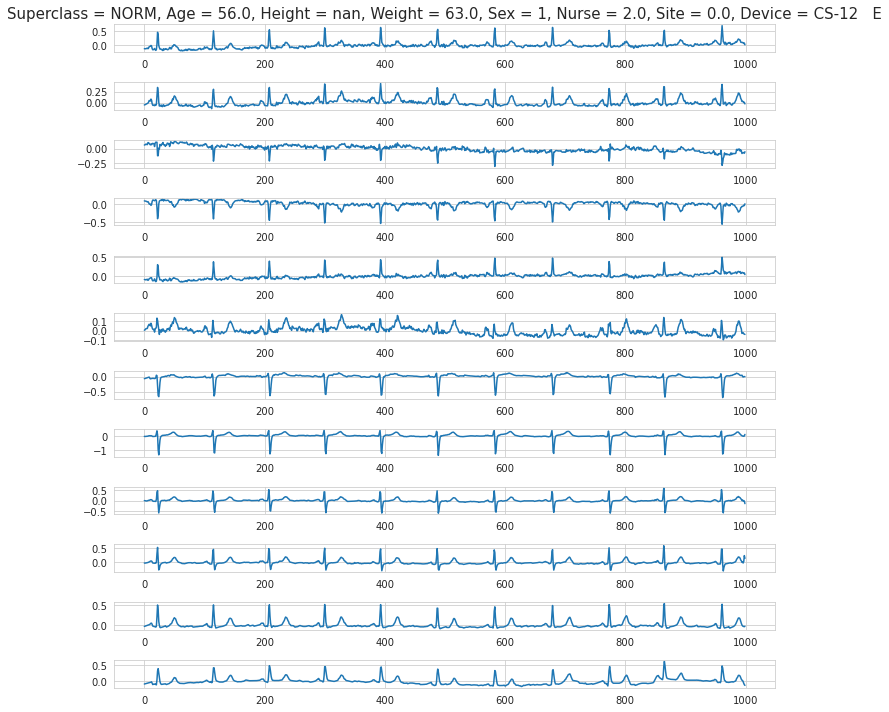

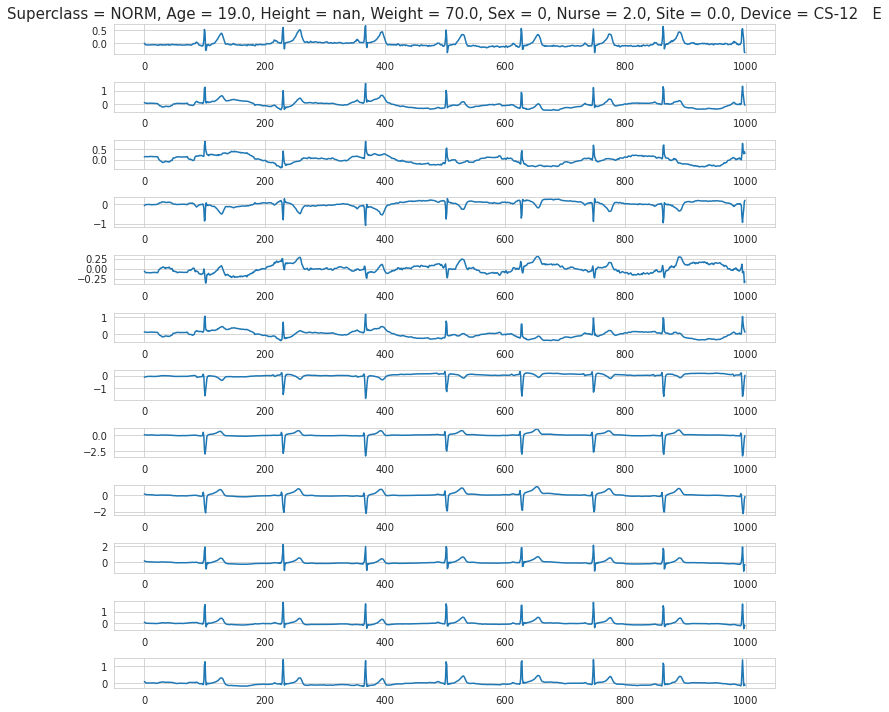

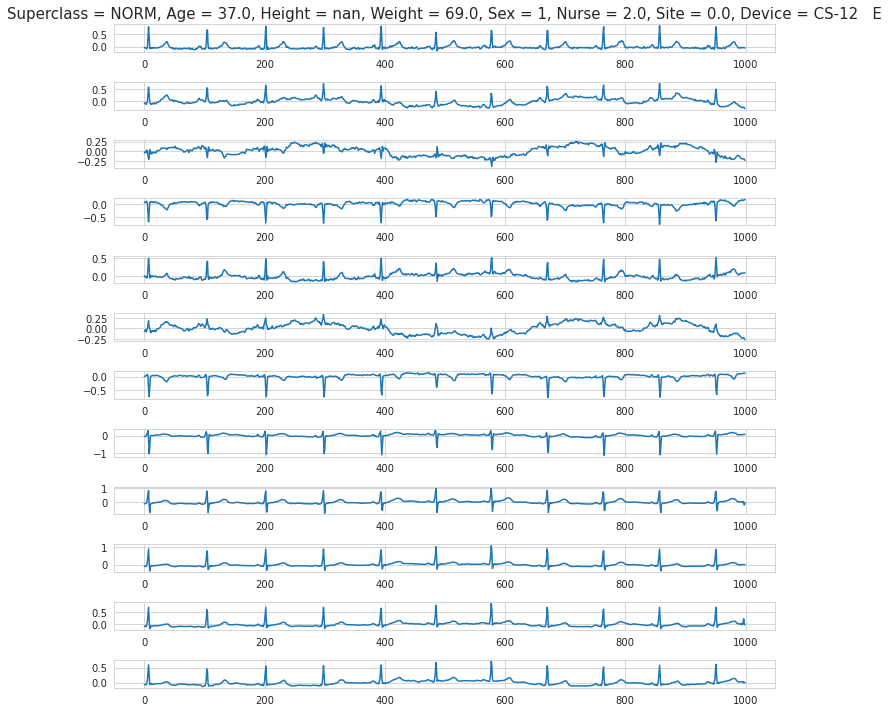

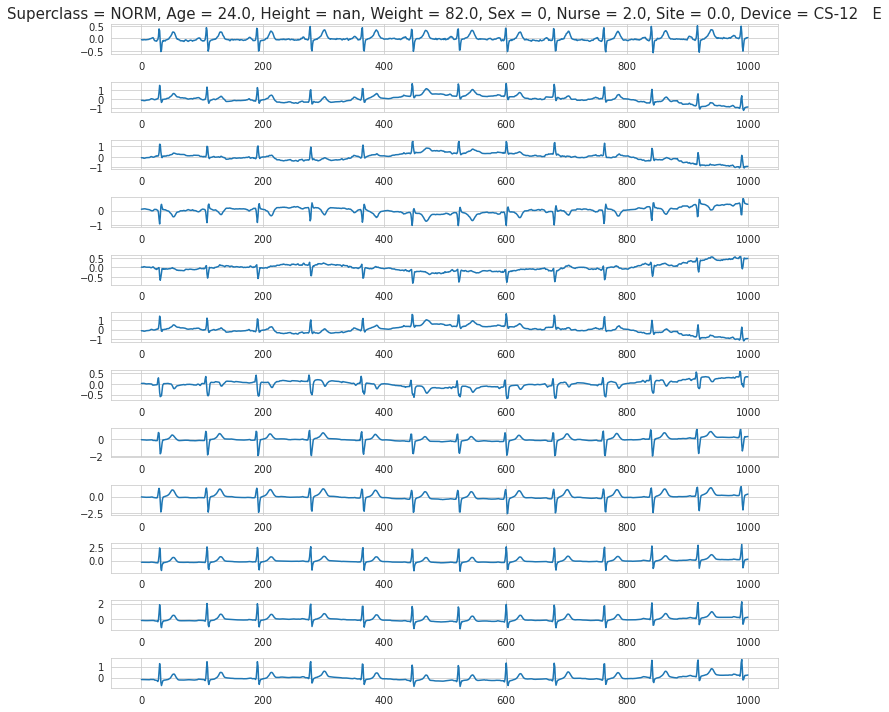

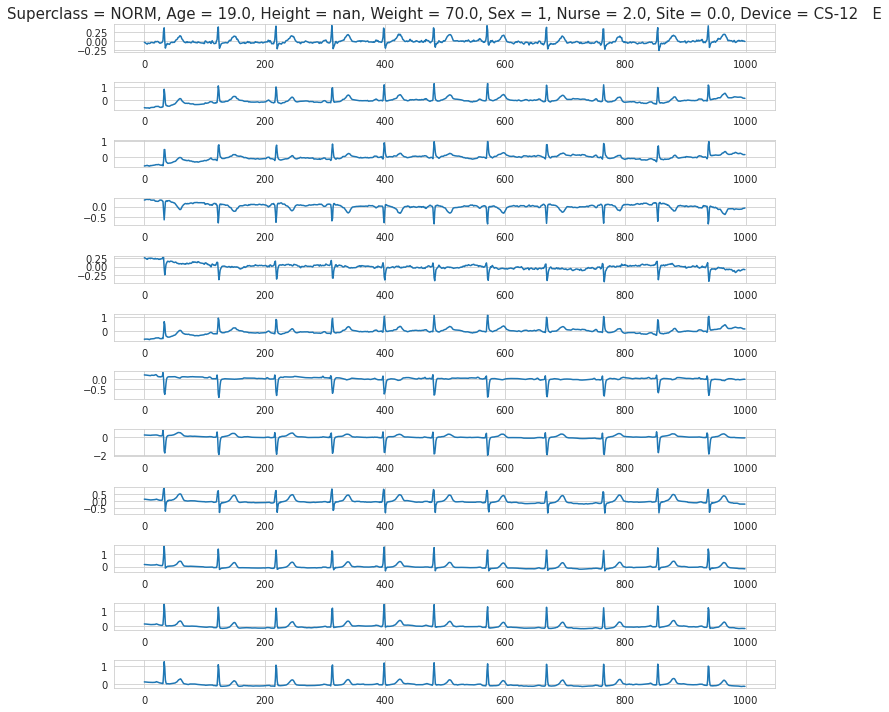

...

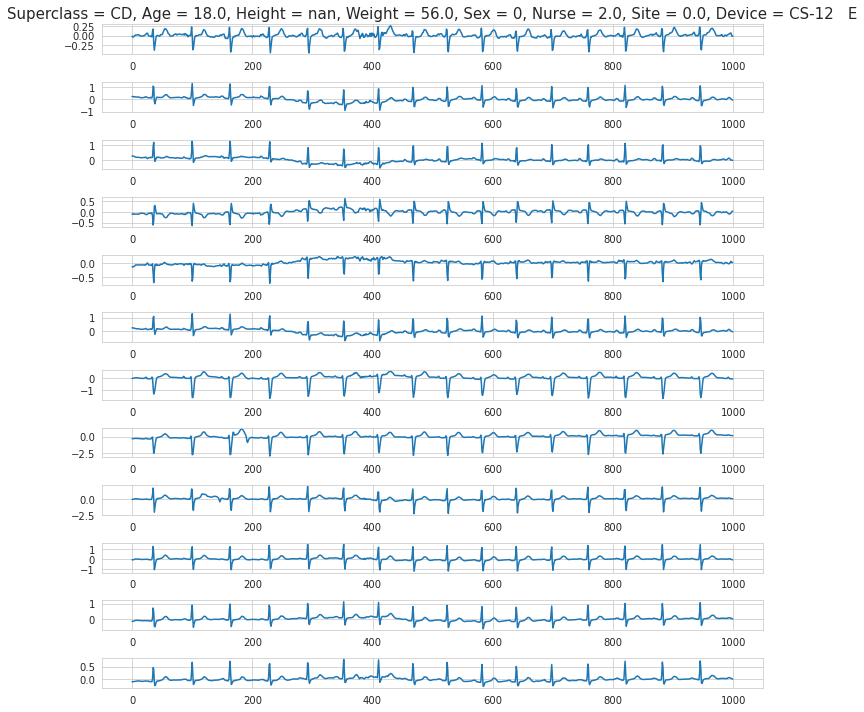

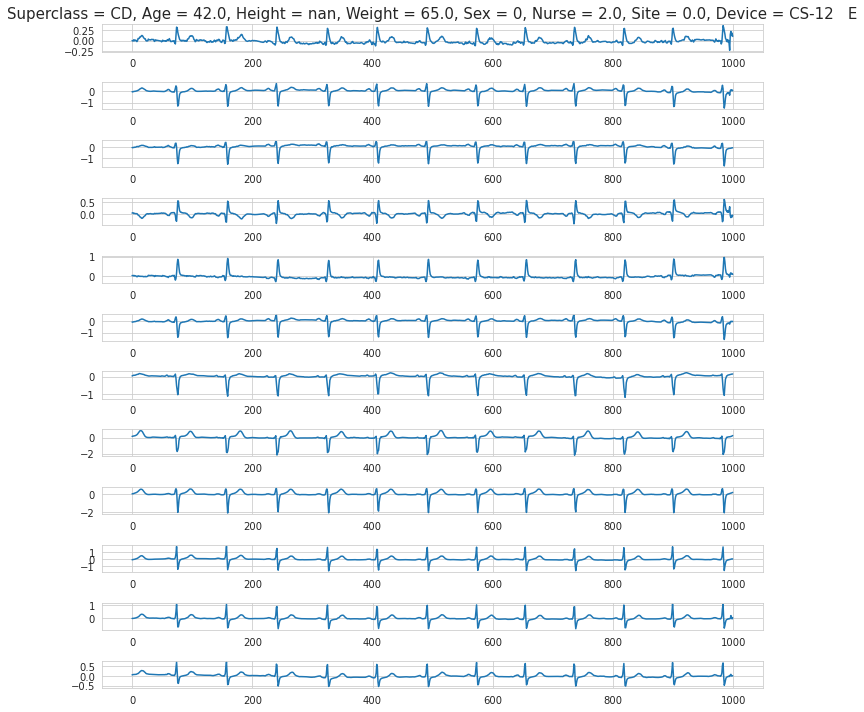

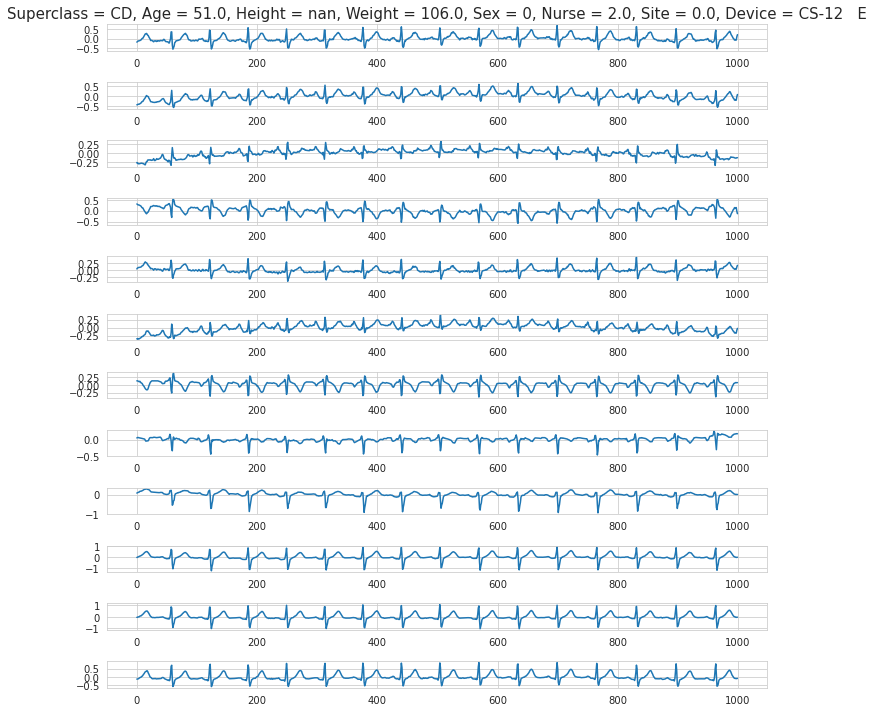

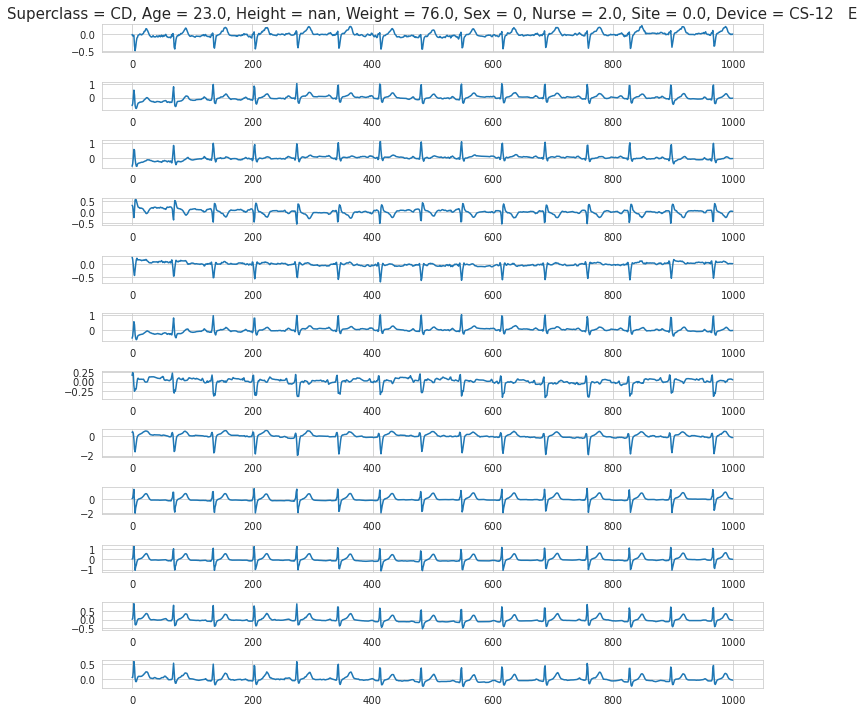

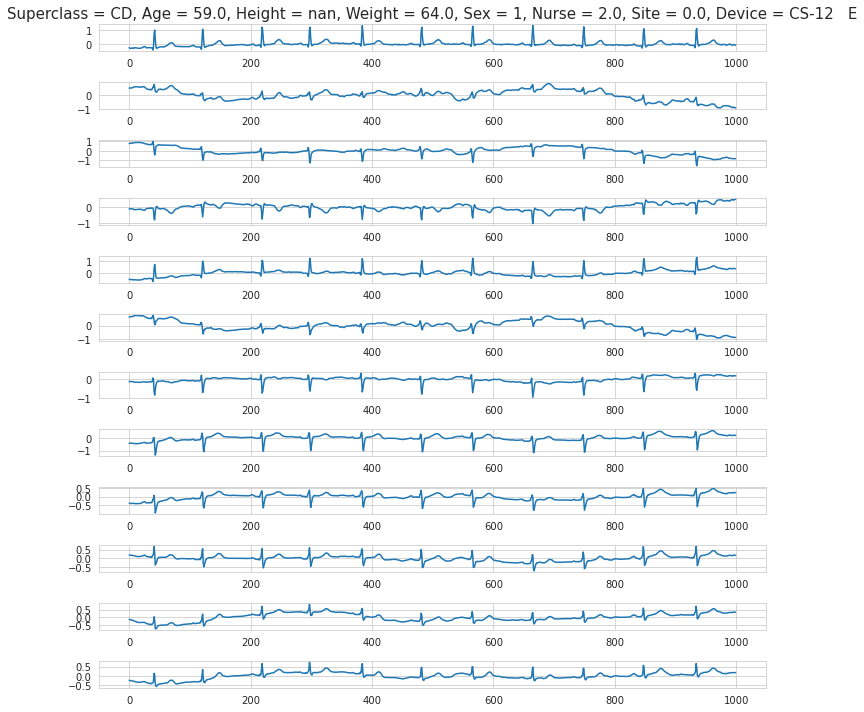

In [ ]:
sample_num = 5

for superclass in superclass_cols:
    filt = y_all[superclass] == 1
    y_selected = y_all.loc[filt]
    x_selected = x_all[filt]

    for i in range(sample_num):
        y_ = y_selected.iloc[i]
        x_ = x_selected[i]

        #display(y_)
        #print(y_.shape, x_.shape); assert False
        bar, axes = plt.subplots(x_.shape[1], 1, figsize=(10,10))
        title = "Superclass = {}, Age = {}, Height = {}, Weight = {}, Sex = {}, Nurse = {}, Site = {}, Device = {}".format(superclass,
                                                                                                                           y_['age'], y_['height'], y_['weight'],
                                                                                                                           y_['sex'], y_['nurse'], y_['site'], y_['device'],)
        axes[0].set_title(title, fontsize=15)

        for c in np.arange(x_.shape[1]):
            sns.lineplot(x=np.arange(x_.shape[0]), y=x_[:, c], ax=axes[c])

        plt.tight_layout()
        plt.show()
        #assert False

# Train-Valid-Test Set Splitting

According to the source of the [dataset](https://physionet.org/content/ptb-xl/1.0.1/), there are recommended ***stratified 10-folds***, where the ***same patients are kept within the same folds***. Moreover, ***9th fold and 10th are of higher quality, which are recommeded to be used as validation set and test set***.


> 5. Cross-validation Folds: recommended 10-fold train-test splits (strat_fold) obtained via stratified sampling while respecting patient assignments, i.e. all records of a particular patient were assigned to the same fold. Records in fold 9 and 10 underwent at least one human evaluation and are therefore of a particularly high label quality. We therefore propose to use folds 1-8 as training set, fold 9 as validation set and fold 10 as test set.

Here, I will split compile fold 1-8 as train sets, fold 9 as validation set, and fold 10 as test set.

### Train

In [ ]:
x_train, y_train = get_data_by_folds(np.arange(1, 9), X, Y, update_cols, meta_cols)
print('data shape', x_train.shape)
y_train

data shape (17441, 1000, 12)


,age,sex,height,weight,nurse,site,device,NORM,MI,STTC,...,sub_ISC_,sub_SEHYP,sub_ISCI,sub_CRBBB,sub_CLBBB,sub_LAO/LAE,sub_ILBBB,sub_WPW,sub_PMI,strat_fold
ecg_id,,,,,,,,,,,,,,,,,,,,,
1,56.0,1,NaN,63.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,3
2,19.0,0,NaN,70.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,2
3,37.0,1,NaN,69.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,5
4,24.0,0,NaN,82.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,3
5,19.0,1,NaN,70.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21832,63.0,0,NaN,NaN,1.0,2.0,AT-60 3,0,0,0,...,0,0,0,0,0,0,0,0,0,7
21833,67.0,1,NaN,NaN,1.0,2.0,AT-60 3,0,0,1,...,0,0,0,0,0,0,0,0,0,7
21834,93.0,0,NaN,NaN,1.0,2.0,AT-60 3,1,0,0,...,0,0,0,0,0,0,0,0,0,4


### Valid

In [ ]:
x_valid, y_valid = get_data_by_folds([9], X, Y, update_cols, meta_cols)
print('data shape', x_valid.shape)
y_valid

data shape (2193, 1000, 12)


,age,sex,height,weight,nurse,site,device,NORM,MI,STTC,...,sub_ISC_,sub_SEHYP,sub_ISCI,sub_CRBBB,sub_CLBBB,sub_LAO/LAE,sub_ILBBB,sub_WPW,sub_PMI,strat_fold
ecg_id,,,,,,,,,,,,,,,,,,,,,
8,48.0,0,NaN,95.0,2.0,0.0,CS-12 E,0,1,0,...,0,0,0,0,0,0,0,0,0,9
10,22.0,1,NaN,56.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,9
17,56.0,0,NaN,NaN,2.0,0.0,CS-12 E,0,0,0,...,0,0,0,0,0,0,0,0,0,9
18,56.0,0,NaN,NaN,2.0,0.0,CS-12 E,0,0,0,...,0,0,0,0,0,0,0,0,0,9
20,56.0,0,NaN,NaN,2.0,0.0,CS-12 E,0,0,0,...,0,0,0,0,0,0,0,0,0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21777,54.0,0,NaN,NaN,1.0,2.0,AT-60 3,1,0,0,...,0,0,0,0,0,0,0,0,0,9
21788,72.0,1,NaN,NaN,1.0,2.0,AT-60 3,0,1,0,...,0,0,0,0,0,0,0,0,0,9
21817,66.0,0,NaN,NaN,1.0,2.0,AT-60 3,0,0,0,...,0,0,0,0,0,0,0,0,0,9


### Test

In [ ]:
x_test, y_test = get_data_by_folds([10], X, Y, update_cols, meta_cols)
print('data shape', x_test.shape)
y_test

data shape (2203, 1000, 12)


,age,sex,height,weight,nurse,site,device,NORM,MI,STTC,...,sub_ISC_,sub_SEHYP,sub_ISCI,sub_CRBBB,sub_CLBBB,sub_LAO/LAE,sub_ILBBB,sub_WPW,sub_PMI,strat_fold
ecg_id,,,,,,,,,,,,,,,,,,,,,
9,55.0,0,NaN,70.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,10
38,40.0,0,NaN,72.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,10
40,60.0,0,NaN,85.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,10
57,26.0,0,NaN,93.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,10
59,54.0,0,NaN,67.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21809,69.0,1,NaN,NaN,1.0,2.0,AT-60 3,1,0,0,...,0,0,0,0,0,0,0,0,0,10
21812,67.0,0,NaN,NaN,1.0,2.0,AT-60 3,0,0,0,...,0,0,0,1,0,0,0,0,0,10
21818,84.0,1,NaN,NaN,1.0,2.0,AT-60 3,1,0,0,...,0,0,0,0,0,0,0,0,0,10


In [ ]:
id_cols = ['ecg_id']
channel_cols = ['channel-{}'.format(i) for i in range(12)]

y_train.to_csv('train_meta.csv', index=True)
y_train_signal = pd.DataFrame(columns=id_cols+channel_cols, index=np.arange(y_train.shape[0]*1000), dtype=np.float32)

ecg_ids = []
signals = []
for i, ecg_id in enumerate(y_train.index.values):
    y_train_signal.loc[i*1000:(i+1)*1000-1, 'ecg_id'] = [ecg_id]*1000
    y_train_signal.loc[i*1000:(i+1)*1000-1, channel_cols] = x_train[i,:,:]

y_train_signal['ecg_id'] = y_train_signal['ecg_id'].astype(np.int)
y_train_signal.to_csv('train_signal.csv', index=False)

display(y_train)
display(y_train_signal)

,age,sex,height,weight,nurse,site,device,NORM,MI,STTC,...,sub_ISC_,sub_SEHYP,sub_ISCI,sub_CRBBB,sub_CLBBB,sub_LAO/LAE,sub_ILBBB,sub_WPW,sub_PMI,strat_fold
ecg_id,,,,,,,,,,,,,,,,,,,,,
1,56.0,1,NaN,63.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,3
2,19.0,0,NaN,70.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,2
3,37.0,1,NaN,69.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,5
4,24.0,0,NaN,82.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,3
5,19.0,1,NaN,70.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21832,63.0,0,NaN,NaN,1.0,2.0,AT-60 3,0,0,0,...,0,0,0,0,0,0,0,0,0,7
21833,67.0,1,NaN,NaN,1.0,2.0,AT-60 3,0,0,1,...,0,0,0,0,0,0,0,0,0,7
21834,93.0,0,NaN,NaN,1.0,2.0,AT-60 3,1,0,0,...,0,0,0,0,0,0,0,0,0,4


,ecg_id,channel-0,channel-1,channel-2,channel-3,channel-4,channel-5,channel-6,channel-7,channel-8,channel-9,channel-10,channel-11
0,1,-0.119,-0.055,0.064,0.086,-0.091,0.004,-0.069,-0.031,0.000,-0.026,-0.039,-0.079
1,1,-0.116,-0.051,0.065,0.083,-0.090,0.006,-0.064,-0.036,-0.003,-0.031,-0.034,-0.074
2,1,-0.120,-0.044,0.076,0.082,-0.098,0.016,-0.058,-0.034,-0.010,-0.028,-0.029,-0.069
3,1,-0.117,-0.038,0.080,0.077,-0.098,0.021,-0.050,-0.030,-0.015,-0.023,-0.022,-0.064
4,1,-0.103,-0.031,0.072,0.066,-0.087,0.021,-0.045,-0.027,-0.020,-0.019,-0.018,-0.058
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17440995,21836,0.096,0.189,0.093,-0.143,0.001,0.141,-0.034,0.189,0.162,0.227,0.183,0.128
17440996,21836,0.051,0.119,0.068,-0.085,-0.009,0.093,-0.049,0.195,0.172,0.217,0.127,0.081
17440997,21836,0.033,0.070,0.037,-0.052,-0.002,0.054,-0.097,0.140,0.215,0.218,0.101,0.052
17440998,21836,0.027,0.082,0.055,-0.055,-0.014,0.068,-0.104,0.123,0.200,0.210,0.335,0.010


In [ ]:
y_valid.to_csv('valid_meta.csv', index=True)
y_valid_signal = pd.DataFrame(columns=id_cols+channel_cols, index=np.arange(y_valid.shape[0]*1000), dtype=np.float32)

ecg_ids = []
signals = []
for i, ecg_id in enumerate(y_valid.index.values):
    y_valid_signal.loc[i*1000:(i+1)*1000-1, 'ecg_id'] = [ecg_id]*1000
    y_valid_signal.loc[i*1000:(i+1)*1000-1, channel_cols] = x_valid[i,:,:]

y_valid_signal['ecg_id'] = y_valid_signal['ecg_id'].astype(np.int)
y_valid_signal.to_csv('valid_signal.csv', index=False)

display(y_valid)
display(y_valid_signal)

,age,sex,height,weight,nurse,site,device,NORM,MI,STTC,...,sub_ISC_,sub_SEHYP,sub_ISCI,sub_CRBBB,sub_CLBBB,sub_LAO/LAE,sub_ILBBB,sub_WPW,sub_PMI,strat_fold
ecg_id,,,,,,,,,,,,,,,,,,,,,
8,48.0,0,NaN,95.0,2.0,0.0,CS-12 E,0,1,0,...,0,0,0,0,0,0,0,0,0,9
10,22.0,1,NaN,56.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,9
17,56.0,0,NaN,NaN,2.0,0.0,CS-12 E,0,0,0,...,0,0,0,0,0,0,0,0,0,9
18,56.0,0,NaN,NaN,2.0,0.0,CS-12 E,0,0,0,...,0,0,0,0,0,0,0,0,0,9
20,56.0,0,NaN,NaN,2.0,0.0,CS-12 E,0,0,0,...,0,0,0,0,0,0,0,0,0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21777,54.0,0,NaN,NaN,1.0,2.0,AT-60 3,1,0,0,...,0,0,0,0,0,0,0,0,0,9
21788,72.0,1,NaN,NaN,1.0,2.0,AT-60 3,0,1,0,...,0,0,0,0,0,0,0,0,0,9
21817,66.0,0,NaN,NaN,1.0,2.0,AT-60 3,0,0,0,...,0,0,0,0,0,0,0,0,0,9


,ecg_id,channel-0,channel-1,channel-2,channel-3,channel-4,channel-5,channel-6,channel-7,channel-8,channel-9,channel-10,channel-11
0,8,-0.041,-0.080,-0.039,0.060,-0.001,-0.060,0.045,-0.005,0.005,-0.055,-0.070,-0.040
1,8,-0.039,-0.076,-0.037,0.058,-0.001,-0.057,0.045,-0.007,0.001,-0.055,-0.070,-0.040
2,8,-0.018,-0.069,-0.051,0.043,0.017,-0.059,0.045,-0.013,-0.006,-0.055,-0.073,-0.045
3,8,-0.013,-0.063,-0.050,0.038,0.019,-0.056,0.045,-0.016,-0.012,-0.058,-0.077,-0.049
4,8,-0.020,-0.055,-0.034,0.038,0.007,-0.044,0.045,-0.021,-0.019,-0.062,-0.079,-0.056
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2192995,21837,-0.024,-0.016,0.008,0.019,-0.016,-0.003,0.069,0.135,0.073,0.024,-0.012,-0.044
2192996,21837,0.000,-0.001,-0.002,0.001,0.001,-0.001,0.071,0.148,0.082,0.034,-0.009,-0.085
2192997,21837,0.091,0.012,-0.079,-0.051,0.085,-0.034,0.069,0.199,0.120,0.063,0.016,-0.117
2192998,21837,0.175,0.022,-0.153,-0.099,0.164,-0.065,0.070,0.244,0.148,0.080,0.018,-0.108


In [ ]:
y_test.to_csv('test_meta.csv', index=True)
y_test_signal = pd.DataFrame(columns=id_cols+channel_cols, index=np.arange(y_test.shape[0]*1000), dtype=np.float32)

ecg_ids = []
signals = []
for i, ecg_id in enumerate(y_test.index.values):
    y_test_signal.loc[i*1000:(i+1)*1000-1, 'ecg_id'] = [ecg_id]*1000
    y_test_signal.loc[i*1000:(i+1)*1000-1, channel_cols] = x_test[i,:,:]

y_test_signal['ecg_id'] = y_test_signal['ecg_id'].astype(np.int)
y_test_signal.to_csv('test_signal.csv', index=False)

display(y_test)
display(y_test_signal)

,age,sex,height,weight,nurse,site,device,NORM,MI,STTC,...,sub_ISC_,sub_SEHYP,sub_ISCI,sub_CRBBB,sub_CLBBB,sub_LAO/LAE,sub_ILBBB,sub_WPW,sub_PMI,strat_fold
ecg_id,,,,,,,,,,,,,,,,,,,,,
9,55.0,0,NaN,70.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,10
38,40.0,0,NaN,72.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,10
40,60.0,0,NaN,85.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,10
57,26.0,0,NaN,93.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,10
59,54.0,0,NaN,67.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21809,69.0,1,NaN,NaN,1.0,2.0,AT-60 3,1,0,0,...,0,0,0,0,0,0,0,0,0,10
21812,67.0,0,NaN,NaN,1.0,2.0,AT-60 3,0,0,0,...,0,0,0,1,0,0,0,0,0,10
21818,84.0,1,NaN,NaN,1.0,2.0,AT-60 3,1,0,0,...,0,0,0,0,0,0,0,0,0,10


,ecg_id,channel-0,channel-1,channel-2,channel-3,channel-4,channel-5,channel-6,channel-7,channel-8,channel-9,channel-10,channel-11
0,9,-0.145,-0.097,0.049,0.121,-0.096,-0.024,-0.579,-0.818,-0.647,-0.452,-0.269,-0.032
1,9,-0.115,-0.083,0.032,0.099,-0.073,-0.025,-0.369,-0.523,-0.454,-0.339,-0.246,-0.041
2,9,-0.064,-0.060,0.005,0.062,-0.034,-0.027,-0.088,-0.147,-0.196,-0.188,-0.199,-0.040
3,9,-0.093,-0.101,-0.008,0.097,-0.042,-0.054,-0.006,-0.052,-0.136,-0.146,-0.164,-0.037
4,9,-0.081,-0.108,-0.027,0.095,-0.027,-0.067,0.028,-0.001,-0.098,-0.097,-0.148,-0.034
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2202995,21826,-0.056,-0.012,0.044,0.034,-0.050,0.016,0.064,-0.045,-0.065,-0.038,-0.014,-0.017
2202996,21826,-0.058,-0.057,0.001,0.057,-0.029,-0.028,0.072,-0.066,-0.071,-0.063,-0.057,-0.061
2202997,21826,-0.109,-0.054,0.055,0.081,-0.081,0.000,0.101,-0.049,-0.069,-0.057,-0.082,-0.090
2202998,21826,-0.091,-0.067,0.024,0.079,-0.057,-0.022,0.170,0.037,0.014,0.003,-0.047,-0.085


### Note:
* x_train, x_valid, x_test: 12-lead ECG signals for train, valid, and test set.
* y_train, y_valid, y_test: fold number, ecg id, possible feature and possible target columns for modeling.
* Columns that **should be skipped** for modeling:
    * **strat_fold**: kept to be used cross validation within train set
    * **ecg id**: the id for the ecg signal in the raw dataset, kept as a reference
* Possibly Feature columns aside the heart beat signal: ['age', 'sex', 'height', 'weight', 'nurse', 'site', 'device']
* Possibly Target columns: All superclass and subclass columns.

# Reference
* [Paper: Wagner, P., Strodthoff, N., Bousseljot, R.-D., Kreiseler, D., Lunze, F.I., Samek, W., Schaeffter, T. (2020), PTB-XL: A Large Publicly Available ECG Dataset. Scientific Data. https://doi.org/10.1038/s41597-020-0495-6](https://www.nature.com/articles/s41597-020-0495-6)

#Preprocessing

In [ ]:
!mv /content/train_signal.csv /content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
import numpy as np

In [ ]:
train_df = pd.read_csv('/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/train_meta.csv', index_col=0)
train_signal = pd.read_csv('/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/train_signal.csv')

valid_df = pd.read_csv('/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/valid_meta.csv', index_col=0)
valid_signal = pd.read_csv('/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/valid_signal.csv')

test_df = pd.read_csv('/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/test_meta.csv', index_col=0)
test_signal = pd.read_csv('/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/test_signal.csv')

print(train_df.shape)

train_df

(17441, 36)


,age,sex,height,weight,nurse,site,device,NORM,MI,STTC,...,sub_ISC_,sub_SEHYP,sub_ISCI,sub_CRBBB,sub_CLBBB,sub_LAO/LAE,sub_ILBBB,sub_WPW,sub_PMI,strat_fold
ecg_id,,,,,,,,,,,,,,,,,,,,,
1,56.0,1,NaN,63.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,3
2,19.0,0,NaN,70.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,2
3,37.0,1,NaN,69.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,5
4,24.0,0,NaN,82.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,3
5,19.0,1,NaN,70.0,2.0,0.0,CS-12 E,1,0,0,...,0,0,0,0,0,0,0,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21832,63.0,0,NaN,NaN,1.0,2.0,AT-60 3,0,0,0,...,0,0,0,0,0,0,0,0,0,7
21833,67.0,1,NaN,NaN,1.0,2.0,AT-60 3,0,0,1,...,0,0,0,0,0,0,0,0,0,7
21834,93.0,0,NaN,NaN,1.0,2.0,AT-60 3,1,0,0,...,0,0,0,0,0,0,0,0,0,4


In [ ]:
!pip install wfdb

In [ ]:
import os
import ast
import wfdb

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow.keras as keras

sns.set_style('darkgrid')

In [ ]:
PATH_TO_DATA = '/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/'

ECG_df = pd.read_csv(os.path.join(PATH_TO_DATA, 'ptbxl_database.csv'), index_col='ecg_id')
ECG_df.scp_codes = ECG_df.scp_codes.apply(lambda x: ast.literal_eval(x))
ECG_df.patient_id = ECG_df.patient_id.astype(int)
ECG_df.nurse = ECG_df.nurse.astype('Int64')
ECG_df.site = ECG_df.site.astype('Int64')
ECG_df.validated_by = ECG_df.validated_by.astype('Int64')

SCP_df = pd.read_csv(os.path.join(PATH_TO_DATA, 'scp_statements.csv'), index_col=0)
SCP_df = SCP_df[SCP_df.diagnostic == 1]

ECG_df

,patient_id,age,sex,height,weight,nurse,site,device,recording_date,report,...,validated_by_human,baseline_drift,static_noise,burst_noise,electrodes_problems,extra_beats,pacemaker,strat_fold,filename_lr,filename_hr
ecg_id,,,,,,,,,,,,,,,,,,,,,
1,15709,56.0,1,NaN,63.0,2,0,CS-12 E,1984-11-09 09:17:34,sinusrhythmus periphere niederspannung,...,True,NaN,", I-V1,",NaN,NaN,NaN,NaN,3,records100/00000/00001_lr,records500/00000/00001_hr
2,13243,19.0,0,NaN,70.0,2,0,CS-12 E,1984-11-14 12:55:37,sinusbradykardie sonst normales ekg,...,True,NaN,NaN,NaN,NaN,NaN,NaN,2,records100/00000/00002_lr,records500/00000/00002_hr
3,20372,37.0,1,NaN,69.0,2,0,CS-12 E,1984-11-15 12:49:10,sinusrhythmus normales ekg,...,True,NaN,NaN,NaN,NaN,NaN,NaN,5,records100/00000/00003_lr,records500/00000/00003_hr
4,17014,24.0,0,NaN,82.0,2,0,CS-12 E,1984-11-15 13:44:57,sinusrhythmus normales ekg,...,True,", II,III,AVF",NaN,NaN,NaN,NaN,NaN,3,records100/00000/00004_lr,records500/00000/00004_hr
5,17448,19.0,1,NaN,70.0,2,0,CS-12 E,1984-11-17 10:43:15,sinusrhythmus normales ekg,...,True,", III,AVR,AVF",NaN,NaN,NaN,NaN,NaN,4,records100/00000/00005_lr,records500/00000/00005_hr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21833,17180,67.0,1,NaN,NaN,1,2,AT-60 3,2001-05-31 09:14:35,ventrikulÄre extrasystole(n) sinustachykardie ...,...,True,NaN,", alles,",NaN,NaN,1ES,NaN,7,records100/21000/21833_lr,records500/21000/21833_hr
21834,20703,300.0,0,NaN,NaN,1,2,AT-60 3,2001-06-05 11:33:39,sinusrhythmus lagetyp normal qrs(t) abnorm ...,...,True,NaN,NaN,NaN,NaN,NaN,NaN,4,records100/21000/21834_lr,records500/21000/21834_hr
21835,19311,59.0,1,NaN,NaN,1,2,AT-60 3,2001-06-08 10:30:27,sinusrhythmus lagetyp normal t abnorm in anter...,...,True,NaN,", I-AVR,",NaN,NaN,NaN,NaN,2,records100/21000/21835_lr,records500/21000/21835_hr


In [ ]:
ECG_df.strat_fold.value_counts()

,count
strat_fold,
10,2198
3,2192
9,2183
2,2181
7,2176
1,2175
5,2174
4,2174
8,2173


In [ ]:
def diagnostic_class(scp):
    res = set()
    for k in scp.keys():
        if k in SCP_df.index:
            res.add(SCP_df.loc[k].diagnostic_class)
    return list(res)

ECG_df['scp_classes'] = ECG_df.scp_codes.apply(diagnostic_class)

In [ ]:
def load_raw_data(df, sampling_rate, path):
    if sampling_rate == 100:
        data = [wfdb.rdsamp(os.path.join(path, f)) for f in df.filename_lr]
    else:
        data = [wfdb.rdsamp(os.path.join(path, f)) for f in df.filename_hr]
    data = np.array([signal for signal, meta in data])
    return data

sampling_rate = 100

ECG_data = load_raw_data(ECG_df, sampling_rate, PATH_TO_DATA)

ECG_data.shape

(21799, 1000, 12)

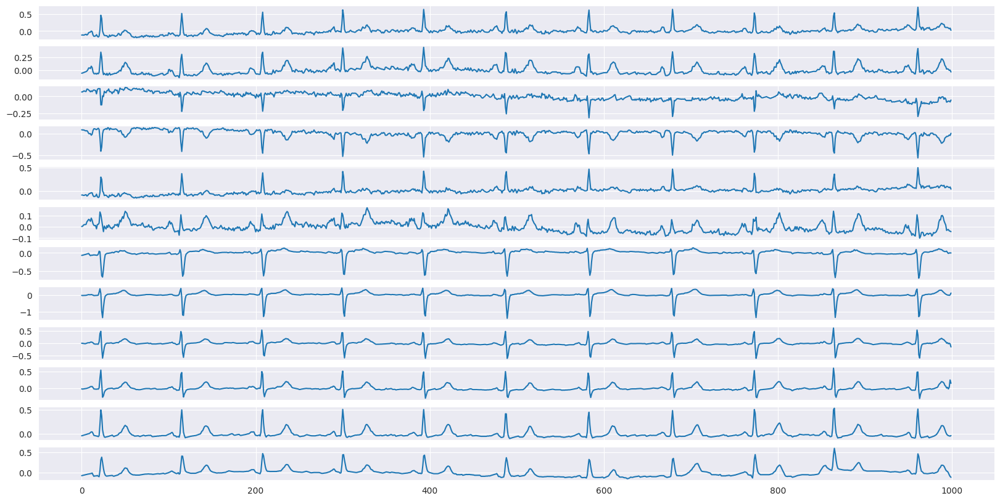

In [ ]:
sample = ECG_data[0]
bar, axes = plt.subplots(sample.shape[1], 1, figsize=(20,10))
for i in range(sample.shape[1]):
    sns.lineplot(x=np.arange(sample.shape[0]), y=sample[:, i], ax=axes[i])
# plt.tight_layout()
plt.show()

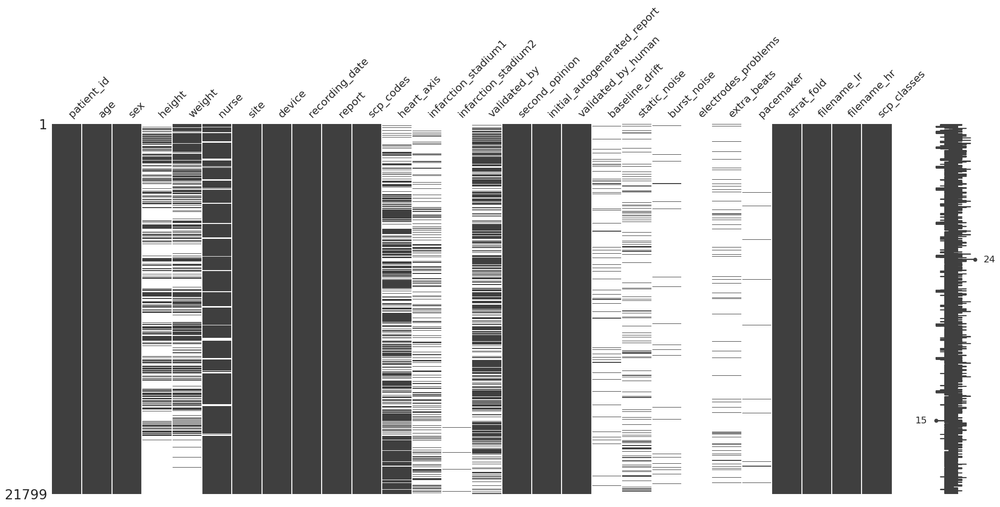

In [ ]:
import missingno as msno

msno.matrix(ECG_df)
plt.show()

In [ ]:
ECG_df[[col for col in ECG_df.columns if col not in ('scp_codes', 'scp_classes')]].nunique(dropna=True)

,0
patient_id,18869
age,89
sex,2
height,77
weight,127
nurse,12
site,51
device,11
recording_date,21795
report,9887


In [ ]:
X = pd.DataFrame(index=ECG_df.index)

X['age'] = ECG_df.age
X.age.fillna(0, inplace=True)

X['sex'] = ECG_df.sex.astype(float)
X.sex.fillna(0, inplace=True)

X['height'] = ECG_df.height
X.loc[X.height < 50, 'height'] = np.nan
X.height.fillna(0, inplace=True)

X['weight'] = ECG_df.weight
X.weight.fillna(0, inplace=True)

X['infarction_stadium1'] = ECG_df.infarction_stadium1.replace({
    'unknown': 0,
    'Stadium I': 1,
    'Stadium I-II': 2,
    'Stadium II': 3,
    'Stadium II-III': 4,
    'Stadium III': 5
}).fillna(0)

X['infarction_stadium2'] = ECG_df.infarction_stadium2.replace({
    'unknown': 0,
    'Stadium I': 1,
    'Stadium II': 2,
    'Stadium III': 3
}).fillna(0)

X['pacemaker'] = (ECG_df.pacemaker == 'ja, pacemaker').astype(float)

X

/tmp/ipython-input-3316299910.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X.age.fillna(0, inplace=True)
/tmp/ipython-input-3316299910.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col

,age,sex,height,weight,infarction_stadium1,infarction_stadium2,pacemaker
ecg_id,,,,,,,
1,56.0,1.0,0.0,63.0,0.0,0.0,0.0
2,19.0,0.0,0.0,70.0,0.0,0.0,0.0
3,37.0,1.0,0.0,69.0,0.0,0.0,0.0
4,24.0,0.0,0.0,82.0,0.0,0.0,0.0
5,19.0,1.0,0.0,70.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...
21833,67.0,1.0,0.0,0.0,0.0,0.0,0.0
21834,300.0,0.0,0.0,0.0,4.0,0.0,0.0
21835,59.0,1.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
Z = pd.DataFrame(0, index=ECG_df.index, columns=['NORM', 'MI', 'STTC', 'CD', 'HYP'], dtype='int')
for i in Z.index:
    for k in ECG_df.loc[i].scp_classes:
        Z.loc[i, k] = 1

Z

,NORM,MI,STTC,CD,HYP
ecg_id,,,,,
1,1,0,0,0,0
2,1,0,0,0,0
3,1,0,0,0,0
4,1,0,0,0,0
5,1,0,0,0,0
...,...,...,...,...,...
21833,0,0,1,0,0
21834,1,0,0,0,0
21835,0,0,1,0,0


In [ ]:
X_train, Y_train, Z_train = X[ECG_df.strat_fold <= 8],  ECG_data[X[ECG_df.strat_fold <= 8].index - 1],  Z[ECG_df.strat_fold <= 8]
X_valid, Y_valid, Z_valid = X[ECG_df.strat_fold == 9],  ECG_data[X[ECG_df.strat_fold == 9].index - 1],  Z[ECG_df.strat_fold == 9]
X_test,  Y_test,  Z_test  = X[ECG_df.strat_fold == 10], ECG_data[X[ECG_df.strat_fold == 10].index - 1], Z[ECG_df.strat_fold == 10]

print(X_train.shape, Y_train.shape, Z_train.shape)
print(X_valid.shape, Y_valid.shape, Z_valid.shape)
print(X_test.shape,  Y_test.shape,  Z_test.shape)

In [ ]:
from sklearn.preprocessing import StandardScaler

X_scaler = StandardScaler()
X_scaler.fit(X_train)

X_train = pd.DataFrame(X_scaler.transform(X_train), columns=X_train.columns)
X_valid = pd.DataFrame(X_scaler.transform(X_valid), columns=X_valid.columns)
X_test  = pd.DataFrame(X_scaler.transform(X_test),  columns=X_test.columns)

In [ ]:
Y_scaler = StandardScaler()
Y_scaler.fit(Y_train.reshape(-1, Y_train.shape[-1]))

Y_train = Y_scaler.transform(Y_train.reshape(-1, Y_train.shape[-1])).reshape(Y_train.shape)
Y_valid = Y_scaler.transform(Y_valid.reshape(-1, Y_valid.shape[-1])).reshape(Y_valid.shape)
Y_test  = Y_scaler.transform(Y_test.reshape(-1, Y_test.shape[-1])).reshape(Y_test.shape)

In [ ]:
NUMPY_DATA_FILE = '/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/data.npz'

save_args = {
    'X_train': X_train.to_numpy().astype('float32'),
    'X_valid': X_valid.to_numpy().astype('float32'),
    'X_test':  X_test.to_numpy().astype('float32'),
    'Y_train': Y_train.astype('float32'),
    'Y_valid': Y_valid.astype('float32'),
    'Y_test':  Y_test.astype('float32'),
    'Z_train': Z_train.to_numpy().astype('float32'),
    'Z_valid': Z_valid.to_numpy().astype('float32'),
    'Z_test':  Z_test.to_numpy().astype('float32'),
}
np.savez(NUMPY_DATA_FILE, **save_args)

#Train model

##1D Convolution Neural Network

##Model 1

In [ ]:
import sys
import os
import math

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
import tensorflow.keras as keras

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

sns.set_style('darkgrid')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
NUMPY_DATA_FILE = '/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/data.npz'

thismodule = sys.modules[__name__]

with np.load(NUMPY_DATA_FILE) as data:
    for k in data.keys():
        setattr(thismodule, k, data[k].astype(float))

In [ ]:
def create_X_model(X, *, units=32, dropouts=0.3):

    X = keras.layers.Dense(units, activation='relu', name='X_dense_1')(X)
    X = keras.layers.Dropout(dropouts, name='X_drop_1')(X)
    X = keras.layers.Dense(units, activation='relu', name='X_dense_2')(X)
    X = keras.layers.Dropout(dropouts, name='X_drop_2')(X)

    return X

In [ ]:
def create_model01(X_shape, Z_shape):
    X_inputs = keras.Input(X_shape[1:], name='X_inputs')

    X = create_X_model(X_inputs)
    X = keras.layers.Dense(64, activation='relu', name='Z_dense_1')(X)
    X = keras.layers.Dense(64, activation='relu', name='Z_dense_2')(X)
    X = keras.layers.Dropout(0.5, name='Z_drop_1')(X)
    outputs = keras.layers.Dense(Z_shape[-1], activation='sigmoid', name='Z_outputs')(X)

    model = keras.Model(inputs=X_inputs, outputs=outputs, name='model01')
    return model

In [ ]:
model01 = create_model01(X_train.shape, Z_train.shape)
model01.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'Precision', 'Recall'])
model01.summary()

Model: "model01"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ X_inputs (InputLayer)           │ (None, 7)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ X_dense_1 (Dense)               │ (None, 32)             │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ X_drop_1 (Dropout)              │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ X_dense_2 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ X_drop_2 (Dropout)              │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Z_dense_1 (Dense)               │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Z_dense_2 (Dense)               │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Z_drop_1 (Dropout)              │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Z_outputs (Dense)               │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,909 (30.89 KB)

 Trainable params: 7,909 (30.89 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
MODEL_CHECKPOINT = '/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/model01.keras'

callbacks_list = [
    keras.callbacks.EarlyStopping(monitor='val_binary_accuracy', patience=10),
    keras.callbacks.ModelCheckpoint(filepath=MODEL_CHECKPOINT, monitor='val_binary_accuracy', save_best_only=True)
]

history = model01.fit(X_train, Z_train, epochs=40, batch_size=32, callbacks=callbacks_list, validation_data=(X_valid, Z_valid))

model01 = keras.models.load_model(MODEL_CHECKPOINT)

Epoch 1/40
546/546 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - Precision: 0.5326 - Recall: 0.1956 - binary_accuracy: 0.7492 - loss: 0.5428 - val_Precision: 0.7212 - val_Recall: 0.2972 - val_binary_accuracy: 0.7910 - val_loss: 0.4706
Epoch 2/40
546/546 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - Precision: 0.7262 - Recall: 0.2745 - binary_accuracy: 0.7887 - loss: 0.4828 - val_Precision: 0.7313 - val_Recall: 0.2933 - val_binary_accuracy: 0.7918 - val_loss: 0.4676
Epoch 3/40
546/546 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - Precision: 0.7486 - Recall: 0.2757 - binary_accuracy: 0.7918 - loss: 0.4742 - val_Precision: 0.7332 - val_Recall: 0.2961 - val_binary_accuracy: 0.7925 - val_loss: 0.4664
Epoch 4/40
546/546 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - Precision: 0.7582 - Recall: 0.2763 - binary_accuracy: 0.7925 - loss: 0.4742 - val_Precision: 0.7168 - val_Recall: 0.3043 - val_binary_accuracy: 0.7914 - val_loss: 0.4678
Epoch 5/40
546/546 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - Precision: 0.7463 - Recall: 0.2882 - binary_accura

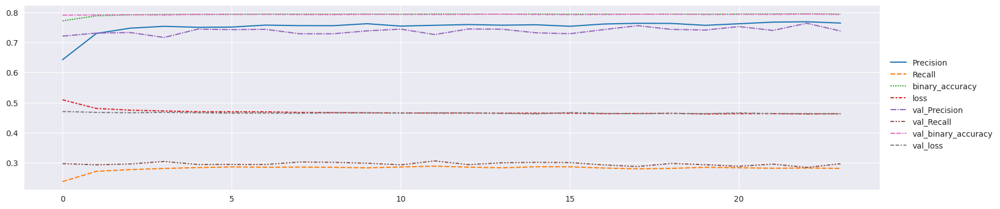

In [ ]:
sns.relplot(data=pd.DataFrame(history.history), kind='line', height=4, aspect=4)
plt.show()

In [ ]:
model01.evaluate(X_test, Z_test)

69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - Precision: 0.7691 - Recall: 0.3419 - binary_accuracy: 0.8097 - loss: 0.4426


[0.4605426490306854,
 0.7977303266525269,
 0.7645429372787476,
 0.2956086993217468]

###Confusion map

In [ ]:
import sklearn.metrics

In [ ]:
def print_confusion_matrix(confusion_matrix, axes, class_label, class_names, fontsize=14):

    df_cm = pd.DataFrame(confusion_matrix, index=class_names, columns=class_names)

    try:
        heatmap = sns.heatmap(df_cm, annot=True, fmt="d", cbar=False, ax=axes)
    except ValueError:
        raise ValueError("Confusion matrix values must be integers.")
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)
    axes.set_ylabel('True label')
    axes.set_xlabel('Predicted label')
    axes.set_title("Class - " + class_label)

In [ ]:
labels=['NORM', 'MI', 'STTC', 'CD', 'HYP']

Z_test = Z_test.astype(int)
Z_pred_01 = model01.predict(X_test).round().astype(int)

69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


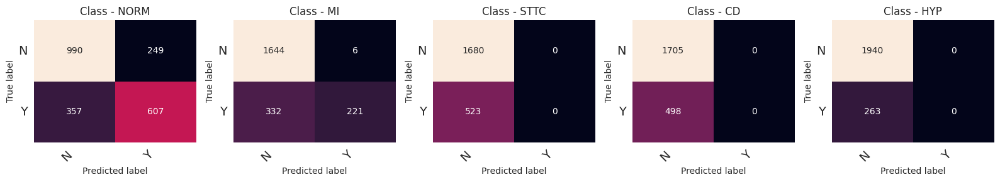

              precision    recall  f1-score   support

        NORM       0.71      0.63      0.67       964
          MI       0.97      0.40      0.57       553
        STTC       0.00      0.00      0.00       523
          CD       0.00      0.00      0.00       498
         HYP       0.00      0.00      0.00       263

   micro avg       0.76      0.30      0.43      2801
   macro avg       0.34      0.21      0.25      2801
weighted avg       0.44      0.30      0.34      2801
 samples avg       0.38      0.34      0.35      2801



In [ ]:
fig, ax = plt.subplots(1, 5, figsize=(16, 3))

for axes, cfs_matrix, label in zip(ax.flatten(), sklearn.metrics.multilabel_confusion_matrix(Z_test, Z_pred_01), labels):
    print_confusion_matrix(cfs_matrix, axes, label, ["N", "Y"])

fig.tight_layout()
plt.show()

print(sklearn.metrics.classification_report(Z_test, Z_pred_01, target_names=labels, zero_division=0))

## Model 2


In [ ]:
def create_Y_model(X, *, filters=(32, 64, 128), kernel_size=(5, 3, 3), strides=(1, 1, 1)):

    f1, f2, f3 = filters
    k1, k2, k3 = kernel_size
    s1, s2, s3 = strides

    X = keras.layers.Conv1D(f1, k1, strides=s1, padding='same', name='Y_conv_1')(X)
    X = keras.layers.BatchNormalization(name='Y_norm_1')(X)
    X = keras.layers.ReLU(name='Y_relu_1')(X)

    X = keras.layers.MaxPool1D(2, name='Y_pool_1')(X)

    X = keras.layers.Conv1D(f2, k2, strides=s2, padding='same', name='Y_conv_2')(X)
    X = keras.layers.BatchNormalization(name='Y_norm_2')(X)
    X = keras.layers.ReLU(name='Y_relu_2')(X)

    X = keras.layers.MaxPool1D(2, name='Y_pool_2')(X)

    X = keras.layers.Conv1D(f3, k3, strides=s3, padding='same', name='Y_conv_3')(X)
    X = keras.layers.BatchNormalization(name='Y_norm_3')(X)
    X = keras.layers.ReLU(name='Y_relu_3')(X)

    X = keras.layers.GlobalAveragePooling1D(name='Y_aver')(X)
    X = keras.layers.Dropout(0.5, name='Y_drop')(X)

    return X

In [ ]:
def create_model02(X_shape, Y_shape, Z_shape):
    X_inputs = keras.Input(X_shape[1:], name='X_inputs')
    Y_inputs = keras.Input(Y_shape[1:], name='Y_inputs')

    X = keras.layers.Concatenate(name='Z_concat')([create_X_model(X_inputs), create_Y_model(Y_inputs, filters=(64, 128, 256), kernel_size=(7, 3, 3))])
    X = keras.layers.Dense(64, activation='relu', name='Z_dense_1')(X)
    X = keras.layers.Dense(64, activation='relu', name='Z_dense_2')(X)
    X = keras.layers.Dropout(0.5, name='Z_drop_1')(X)
    outputs = keras.layers.Dense(Z_shape[-1], activation='sigmoid', name='Z_outputs')(X)

    model = keras.Model(inputs=[X_inputs, Y_inputs], outputs=outputs, name='model02')
    return model

In [ ]:
model02 = create_model02(X_train.shape, Y_train.shape, Z_train.shape)
model02.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'Precision', 'Recall'])
model02.summary()

Model: "model02"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Y_inputs            │ (None, 1000, 12)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_conv_1 (Conv1D)   │ (None, 1000, 64)  │      5,440 │ Y_inputs[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_norm_1            │ (None, 1000, 64)  │        256 │ Y_conv_1[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_relu_1 (ReLU)     │ (None, 1000, 64)  │          0 │ Y_norm_1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_pool_1            │ (None, 500, 64)   │          0 │ Y_relu_1[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_conv_2 (Conv1D)   │ (None, 500, 128)  │     24,704 │ Y_pool_1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_norm_2            │ (None, 500, 128)  │        512 │ Y_conv_2[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_relu_2 (ReLU)     │ (None, 500, 128)  │          0 │ Y_norm_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_pool_2            │ (None, 250, 128)  │          0 │ Y_relu_2[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ X_inputs            │ (None, 7)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_conv_3 (Conv1D)   │ (None, 250, 256)  │     98,560 │ Y_pool_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ X_dense_1 (Dense)   │ (None, 32)        │        256 │ X_inputs[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_norm_3            │ (None, 250, 256)  │      1,024 │ Y_conv_3[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ X_drop_1 (Dropout)  │ (None, 32)        │          0 │ X_dense_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_relu_3 (ReLU)     │ (None, 250, 256)  │          0 │ Y_norm_3[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ X_dense_2 (Dense)   │ (None, 32)        │      1,056 │ X_drop_1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_aver              │ (None, 256)       │          0 │ Y_relu_3[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ X_drop_2 (Dropout)  │ (None, 32)        │          0 │ X_dense_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_drop (Dropout)    │ (None, 256)       │          0 │ Y_aver[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Z_concat            │ (None, 288)       │          0 │ X_drop_2[0][0],   │
│ (Concatenate)       │                   │            │ Y_drop[0][0]      │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 154,789 (604.64 KB)

 Trainable params: 153,893 (601.14 KB)

 Non-trainable params: 896 (3.50 KB)

In [ ]:
MODEL_CHECKPOINT = '/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/model02.keras'

callbacks_list = [
    keras.callbacks.EarlyStopping(monitor='val_binary_accuracy', patience=20),
    keras.callbacks.ModelCheckpoint(filepath=MODEL_CHECKPOINT, monitor='val_binary_accuracy', save_best_only=True)
]

history = model02.fit([X_train, Y_train], Z_train, epochs=100, batch_size=32, callbacks=callbacks_list, validation_data=([X_valid, Y_valid], Z_valid))

model02 = keras.models.load_model(MODEL_CHECKPOINT)

Epoch 1/100
546/546 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - Precision: 0.6311 - Recall: 0.4296 - binary_accuracy: 0.7907 - loss: 0.4574 - val_Precision: 0.7712 - val_Recall: 0.6493 - val_binary_accuracy: 0.8611 - val_loss: 0.3289
Epoch 2/100
546/546 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - Precision: 0.7569 - Recall: 0.6177 - binary_accuracy: 0.8521 - loss: 0.3572 - val_Precision: 0.7822 - val_Recall: 0.6739 - val_binary_accuracy: 0.8687 - val_loss: 0.3200
Epoch 3/100
546/546 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - Precision: 0.7837 - Recall: 0.6518 - binary_accuracy: 0.8654 - loss: 0.3287 - val_Precision: 0.7770 - val_Recall: 0.6975 - val_binary_accuracy: 0.8715 - val_loss: 0.3099
Epoch 4/100
546/546 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - Precision: 0.7962 - Recall: 0.6756 - binary_accuracy: 0.8730 - loss: 0.3138 - val_Precision: 0.7810 - val_Recall: 0.6821 - val_binary_accuracy: 0.8699 - val_loss: 0.3139
Epoch 5/100
546/546 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - Precision: 0.8028 - Recall: 0.6808 - binar

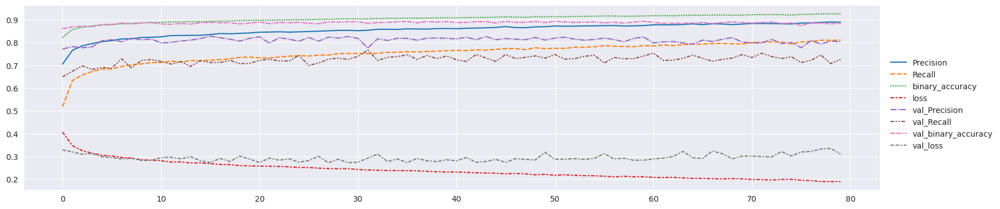

In [ ]:
sns.relplot(data=pd.DataFrame(history.history), kind='line', height=4, aspect=4)
plt.show()

In [ ]:
model02.evaluate([X_test, Y_test], Z_test)

69/69 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - Precision: 0.8358 - Recall: 0.7497 - binary_accuracy: 0.9005 - loss: 0.2765


[0.2834564745426178,
 0.8943259716033936,
 0.8249305486679077,
 0.7418779134750366]

###Confusion map

In [ ]:
model02 = keras.models.load_model('/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/model02.keras')


labels=['NORM', 'MI', 'STTC', 'CD', 'HYP']

Z_test = Z_test.astype(int)

Z_pred_02 = model02.predict([X_test, Y_test]).round().astype(int)

69/69 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step


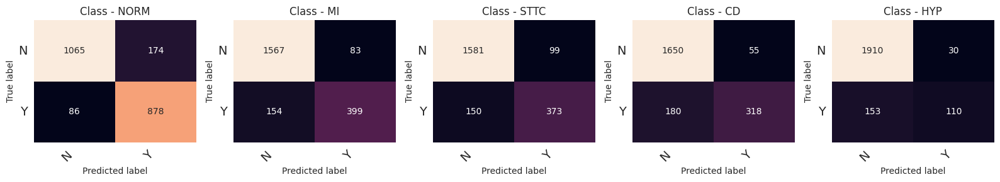

              precision    recall  f1-score   support

        NORM       0.83      0.91      0.87       964
          MI       0.83      0.72      0.77       553
        STTC       0.79      0.71      0.75       523
          CD       0.85      0.64      0.73       498
         HYP       0.79      0.42      0.55       263

   micro avg       0.82      0.74      0.78      2801
   macro avg       0.82      0.68      0.73      2801
weighted avg       0.82      0.74      0.77      2801
 samples avg       0.79      0.76      0.76      2801



In [ ]:
fig, ax = plt.subplots(1, 5, figsize=(16, 3))

for axes, cfs_matrix, label in zip(ax.flatten(), sklearn.metrics.multilabel_confusion_matrix(Z_test, Z_pred_02), labels):
    print_confusion_matrix(cfs_matrix, axes, label, ["N", "Y"])

fig.tight_layout()
plt.show()

print(sklearn.metrics.classification_report(Z_test, Z_pred_02, target_names=labels, zero_division=0))

## Model 3

In [ ]:
def sliding_window(x, size, shift):
    if 0 < size < x.shape[0]:
        shift = np.random.randint(0, x.shape[0] - size) if shift < 0 else shift
        return x[shift:size+shift, :]
    else:
        return x


class AugmentedDataGenerator(keras.utils.Sequence):

    def __init__(self, x, y, z, batch_size=32, window_size=0, window_shift=0, sigma=0.0, **kwargs):
        super(AugmentedDataGenerator, self).__init__(**kwargs)
        self.x = x
        self.y = y
        self.z = z
        self.batch_size = batch_size
        self.window_size = window_size
        self.window_shift = window_shift
        self.sigma = sigma

    @property
    def x_shape(self):
        return (self.batch_size, ) + self.x.shape[1:]

    @property
    def y_shape(self):
        return (self.batch_size, self.window_size if self.window_size > 0 else self.y.shape[1], ) + self.y.shape[2:]

    @property
    def z_shape(self):
        return (self.batch_size, ) + self.z.shape[1:]

    def __len__(self):
        return math.ceil(len(self.y) / self.batch_size)

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = np.array([sliding_window(r, self.window_size, self.window_shift) for r in self.y[idx * self.batch_size:(idx + 1) * self.batch_size]])
        batch_z = self.z[idx * self.batch_size:(idx + 1) * self.batch_size]

        if self.sigma > 0:
            batch_y += np.random.normal(loc=0.0, scale=self.sigma, size=batch_y.shape)

        return (batch_x, batch_y), batch_z



In [ ]:


train_gen = AugmentedDataGenerator(X_train, Y_train, Z_train, window_size=800, window_shift=-1, sigma=0.05)
valid_gen = AugmentedDataGenerator(X_valid, Y_valid, Z_valid, window_size=800)
test_gen  = AugmentedDataGenerator(X_test, Y_test, Z_test, window_size=800)

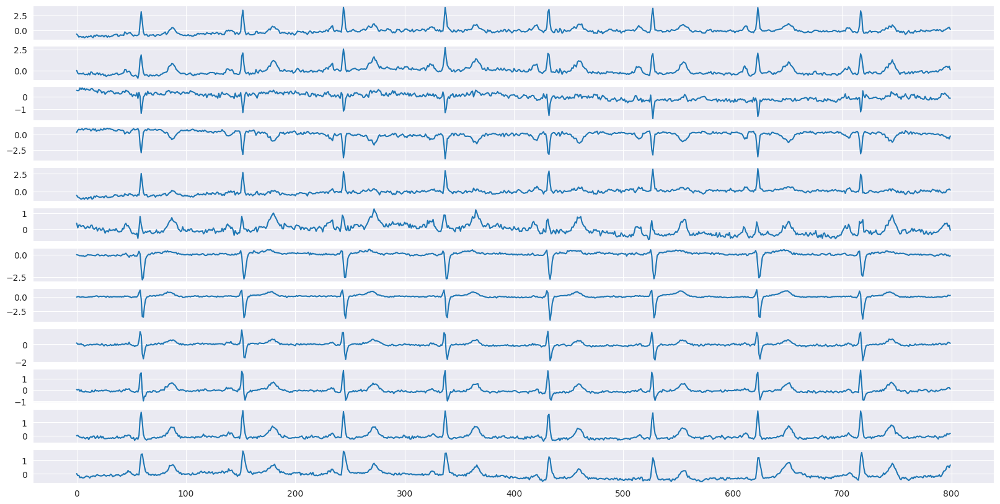

In [ ]:
(x, y), z = train_gen[0]
sample = y[0]
bar, axes = plt.subplots(sample.shape[1], 1, figsize=(20,10))
for i in range(sample.shape[1]):
    sns.lineplot(x=np.arange(sample.shape[0]), y=sample[:, i], ax=axes[i])
# plt.tight_layout()
plt.show()

In [ ]:
model03 = create_model02(train_gen.x_shape, train_gen.y_shape, train_gen.z_shape)
model03.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'Precision', 'Recall'])
model03.summary()

Model: "model02"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Y_inputs            │ (None, 800, 12)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_conv_1 (Conv1D)   │ (None, 800, 64)   │      5,440 │ Y_inputs[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_norm_1            │ (None, 800, 64)   │        256 │ Y_conv_1[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_relu_1 (ReLU)     │ (None, 800, 64)   │          0 │ Y_norm_1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_pool_1            │ (None, 400, 64)   │          0 │ Y_relu_1[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_conv_2 (Conv1D)   │ (None, 400, 128)  │     24,704 │ Y_pool_1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_norm_2            │ (None, 400, 128)  │        512 │ Y_conv_2[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_relu_2 (ReLU)     │ (None, 400, 128)  │          0 │ Y_norm_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_pool_2            │ (None, 200, 128)  │          0 │ Y_relu_2[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ X_inputs            │ (None, 7)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_conv_3 (Conv1D)   │ (None, 200, 256)  │     98,560 │ Y_pool_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ X_dense_1 (Dense)   │ (None, 32)        │        256 │ X_inputs[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_norm_3            │ (None, 200, 256)  │      1,024 │ Y_conv_3[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ X_drop_1 (Dropout)  │ (None, 32)        │          0 │ X_dense_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_relu_3 (ReLU)     │ (None, 200, 256)  │          0 │ Y_norm_3[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ X_dense_2 (Dense)   │ (None, 32)        │      1,056 │ X_drop_1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_aver              │ (None, 256)       │          0 │ Y_relu_3[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ X_drop_2 (Dropout)  │ (None, 32)        │          0 │ X_dense_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Y_drop (Dropout)    │ (None, 256)       │          0 │ Y_aver[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Z_concat            │ (None, 288)       │          0 │ X_drop_2[0][0],   │
│ (Concatenate)       │                   │            │ Y_drop[0][0]      │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 154,789 (604.64 KB)

 Trainable params: 153,893 (601.14 KB)

 Non-trainable params: 896 (3.50 KB)

In [ ]:
MODEL_CHECKPOINT = '/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/model03.keras'

callbacks_list = [
    keras.callbacks.EarlyStopping(monitor='val_binary_accuracy', patience=20),
    keras.callbacks.ModelCheckpoint(filepath=MODEL_CHECKPOINT, monitor='val_binary_accuracy', save_best_only=True)
]

history = model03.fit(train_gen, epochs=100, batch_size=32, callbacks=callbacks_list, validation_data=valid_gen)

model03 = keras.models.load_model(MODEL_CHECKPOINT)

Epoch 1/100
546/546 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - Precision: 0.6075 - Recall: 0.4003 - binary_accuracy: 0.7810 - loss: 0.4701 - val_Precision: 0.7555 - val_Recall: 0.6283 - val_binary_accuracy: 0.8530 - val_loss: 0.3613
Epoch 2/100
546/546 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - Precision: 0.7613 - Recall: 0.6161 - binary_accuracy: 0.8527 - loss: 0.3564 - val_Precision: 0.7897 - val_Recall: 0.6550 - val_binary_accuracy: 0.8672 - val_loss: 0.3259
Epoch 3/100
546/546 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - Precision: 0.7784 - Recall: 0.6437 - binary_accuracy: 0.8622 - loss: 0.3385 - val_Precision: 0.7960 - val_Recall: 0.6586 - val_binary_accuracy: 0.8696 - val_loss: 0.3156
Epoch 4/100
546/546 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - Precision: 0.7967 - Recall: 0.6695 - binary_accuracy: 0.8722 - loss: 0.3190 - val_Precision: 0.8063 - val_Recall: 0.6729 - val_binary_accuracy: 0.8751 - val_loss: 0.3012
Epoch 5/100
546/546 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - Precision: 0.7975 - Recall: 0.6738 

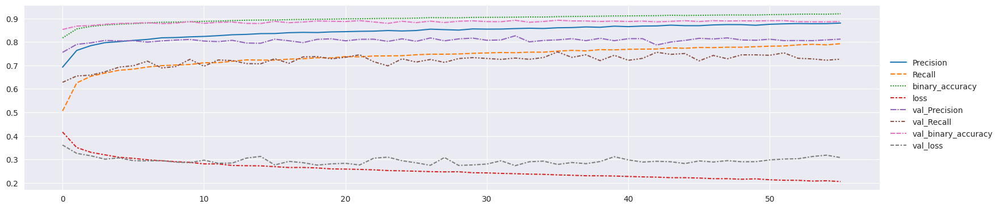

In [ ]:
sns.relplot(data=pd.DataFrame(history.history), kind='line', height=4, aspect=4)
plt.show()

In [ ]:
model03.evaluate(test_gen)

69/69 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - Precision: 0.8134 - Recall: 0.7592 - binary_accuracy: 0.8962 - loss: 0.2726


[0.28212714195251465,
 0.8910577297210693,
 0.8054177761077881,
 0.7536594271659851]

###Confusion map

In [ ]:
Z_pred_03 = model03.predict([X_test, Y_test[:, :800, :]]).round().astype(int)

69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


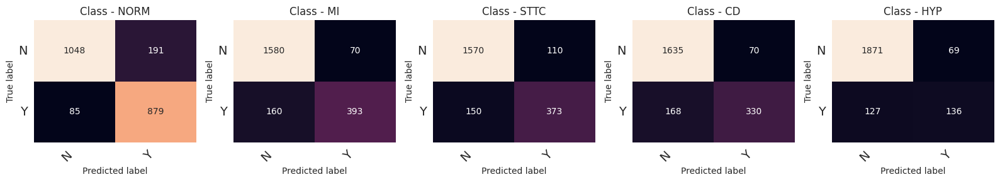

              precision    recall  f1-score   support

        NORM       0.82      0.91      0.86       964
          MI       0.85      0.71      0.77       553
        STTC       0.77      0.71      0.74       523
          CD       0.82      0.66      0.73       498
         HYP       0.66      0.52      0.58       263

   micro avg       0.81      0.75      0.78      2801
   macro avg       0.79      0.70      0.74      2801
weighted avg       0.80      0.75      0.77      2801
 samples avg       0.78      0.76      0.76      2801



In [ ]:
fig, ax = plt.subplots(1, 5, figsize=(16, 3))

for axes, cfs_matrix, label in zip(ax.flatten(), sklearn.metrics.multilabel_confusion_matrix(Z_test, Z_pred_03), labels):
    print_confusion_matrix(cfs_matrix, axes, label, ["N", "Y"])

fig.tight_layout()
plt.show()

print(sklearn.metrics.classification_report(Z_test, Z_pred_03, target_names=labels, zero_division=0))

#Demo

| Tên kênh     | Tên y học | Vị trí đo                        |
| ------------ | --------- | -------------------------------- |
| `channel-0`  | I         | Giữa tay trái và tay phải        |
| `channel-1`  | II        | Giữa chân trái và tay phải       |
| `channel-2`  | III       | Giữa chân trái và tay trái       |
| `channel-3`  | aVR       | Dẫn điện từ tay phải             |
| `channel-4`  | aVL       | Dẫn điện từ tay trái             |
| `channel-5`  | aVF       | Dẫn điện từ chân trái            |
| `channel-6`  | V1        | Ngực phải (xương ức)             |
| `channel-7`  | V2        | Ngực trái gần xương ức           |
| `channel-8`  | V3        | Giữa V2 và V4                    |
| `channel-9`  | V4        | Ngực trái (đường giữa xương đòn) |
| `channel-10` | V5        | Nách trước trái                  |
| `channel-11` | V6        | Nách giữa trái                   |


| Nhóm nhãn | Mô tả                                          |
| --------- | ---------------------------------------------- |
| **NORM**  | ECG bình thường                                |
| **MI**    | Nhồi máu cơ tim (Myocardial Infarction)        |
| **STTC**  | Biến đổi đoạn ST-T (ST/T change)               |
| **CD**    | Bệnh tim cấu trúc (Conduction disorder, block) |
| **HYP**   | Tăng huyết áp / phì đại thất (Hypertrophy)     |


In [ ]:
import numpy as np
import pandas as pd

# File npz đã lưu
NUMPY_DATA_FILE = '/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/data.npz'

data = np.load(NUMPY_DATA_FILE, allow_pickle=True)

X_train = data['X_train']
Y_train = data['Y_train']
Z_train = data['Z_train']

X_valid = data['X_valid']
Y_valid = data['Y_valid']
Z_valid = data['Z_valid']

X_test = data['X_test']
Y_test = data['Y_test']
Z_test = data['Z_test']


In [ ]:
import os
import pandas as pd
import ast

PATH_TO_DATA = '/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/'

ECG_df = pd.read_csv(os.path.join(PATH_TO_DATA, 'ptbxl_database.csv'), index_col='ecg_id')
ECG_df.scp_codes = ECG_df.scp_codes.apply(lambda x: ast.literal_eval(x))
ECG_df.patient_id = ECG_df.patient_id.astype(int)
ECG_df.nurse = ECG_df.nurse.astype('Int64')
ECG_df.site = ECG_df.site.astype('Int64')
ECG_df.validated_by = ECG_df.validated_by.astype('Int64')


In [ ]:
demo_numpy_idx=[8,1000]

In [ ]:
# Lấy ecg_id tương ứng từ test set
ECG_test_df = ECG_df[ECG_df.strat_fold == 10].copy()
ECG_test_df = ECG_test_df.reset_index(drop=False)  # giữ ecg_id gốc
demo_indices = ECG_test_df.loc[demo_numpy_idx, 'ecg_id'].tolist()

In [ ]:
demo_info = ECG_df.loc[demo_indices]  # tất cả cột


In [ ]:
import pandas as pd

labels = ['NORM','MI','STTC','CD','HYP']

demo_labels = pd.DataFrame(Z_test[demo_numpy_idx], columns=labels, index=demo_indices)


In [ ]:
demo_full = pd.concat([demo_info, demo_labels], axis=1)
demo_full


,patient_id,age,sex,height,weight,nurse,site,device,recording_date,report,...,extra_beats,pacemaker,strat_fold,filename_lr,filename_hr,NORM,MI,STTC,CD,HYP
76,21214,38.0,1,NaN,75.0,0,0,CS-12 E,1985-09-21 11:04:47,sinus arrhythmie linkstyp sonst normales ekg,...,NaN,NaN,10,records100/00000/00076_lr,records500/00000/00076_hr,1.0,0.0,0.0,0.0,0.0
8733,15548,70.0,1,NaN,NaN,1,2,CS-12,1992-08-09 09:42:54,sinusrhythmus linkstyp qrs(t) abnormal infe...,...,NaN,NaN,10,records100/08000/08733_lr,records500/08000/08733_hr,0.0,0.0,1.0,0.0,1.0


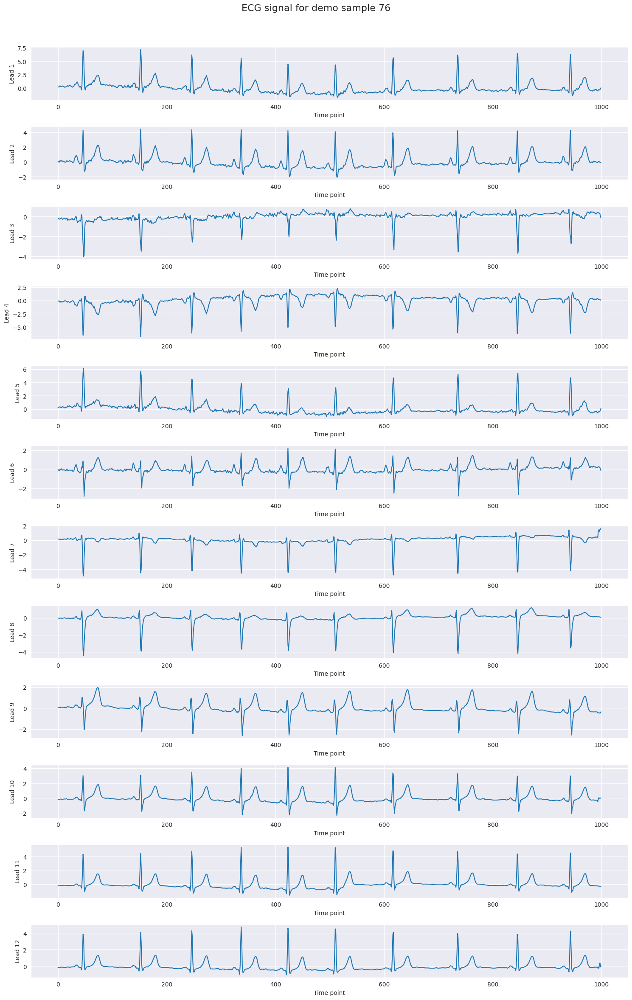

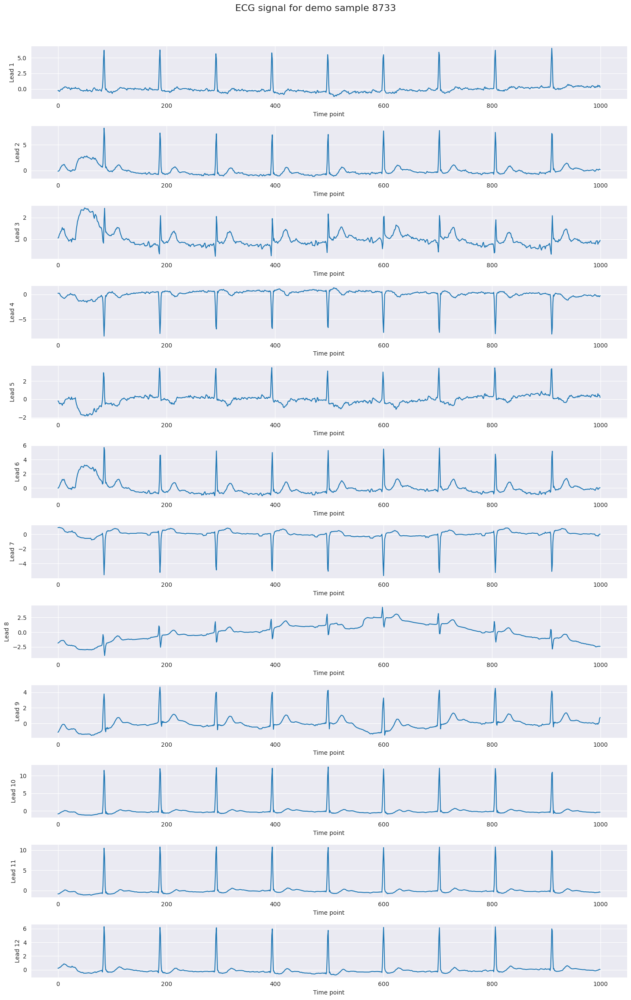

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

for i, idx in enumerate(demo_numpy_idx):
    sample_signal = Y_test[idx]  # shape: (n_points, n_leads)
    n_leads = sample_signal.shape[1]

    fig, axes = plt.subplots(n_leads, 1, figsize=(15, 2*n_leads))
    fig.suptitle(f"ECG signal for demo sample {demo_indices[i]}", fontsize=16)

    for j in range(n_leads):
        axes[j].plot(sample_signal[:, j])
        axes[j].set_ylabel(f"Lead {j+1}")
        axes[j].set_xlabel("Time point")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


In [ ]:
import numpy as np

# Lưu từng mẫu riêng lẻ
for i, idx in enumerate(demo_numpy_idx):
    filename = f"demo_ecg_{demo_indices[i]}.npy"
    np.save(filename, Y_test[idx])
    print(f"Saved ECG signal for ECG ID {demo_indices[i]} -> {filename}")


Saved ECG signal for ECG ID 76 -> demo_ecg_76.npy
Saved ECG signal for ECG ID 8733 -> demo_ecg_8733.npy


In [ ]:
X_demo = X_test[1000][np.newaxis, :]  # shape (1,7)
Y_demo = Y_test[1000][np.newaxis, :]  # shape (1,1000,12)
Z_demo = Z_test[1000][np.newaxis, :]  # shape (1,5) nếu cần

In [ ]:
print(X_demo.shape)
print(Y_demo.shape)

(1, 7)
(1, 1000, 12)


In [ ]:
pred01 = model01.predict(X_demo)
pred02 = model02.predict([X_demo,Y_demo])
pred03 = model03.predict([X_demo, Y_demo[:, :800, :]])



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


In [ ]:
labels = ['NORM', 'MI', 'STTC', 'CD', 'HYP']
# Hiển thị kết quả từng model
print("=== Kết quả model01 ===")
for i, label in enumerate(labels):
    print(f"{label}: {pred01[0,i]*100:.2f}%")

print("\n=== Kết quả model02 ===")
for i, label in enumerate(labels):
    print(f"{label}: {pred02[0,i]*100:.2f}%")

print("\n=== Kết quả model03 ===")
for i, label in enumerate(labels):
    print(f"{label}: {pred03[0,i]*100:.2f}%")

=== Kết quả model01 ===
NORM: 34.85%
MI: 16.59%
STTC: 37.25%
CD: 29.43%
HYP: 20.30%

=== Kết quả model02 ===
NORM: 0.01%
MI: 3.50%
STTC: 94.86%
CD: 6.29%
HYP: 90.31%

=== Kết quả model03 ===
NORM: 0.07%
MI: 4.45%
STTC: 93.64%
CD: 7.34%
HYP: 87.94%


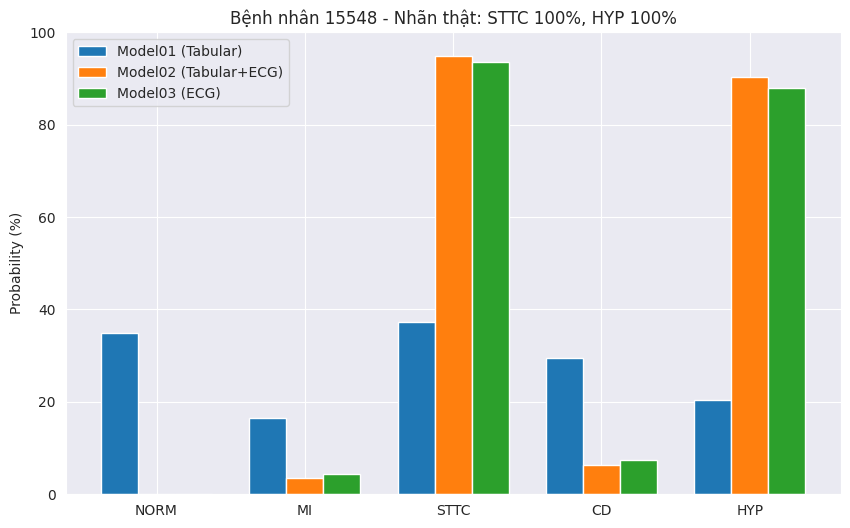

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

labels = ['NORM', 'MI', 'STTC', 'CD', 'HYP']
x = np.arange(len(labels))  # vị trí nhãn trên trục x
width = 0.25  # độ rộng của từng bar

# Dữ liệu dự đoán (tỉ lệ %)
pred01_pct = pred01[0] * 100
pred02_pct = pred02[0] * 100
pred03_pct = pred03[0] * 100

fig, ax = plt.subplots(figsize=(10,6))

# Vẽ 3 nhóm bar cho 3 model
ax.bar(x - width, pred01_pct, width, label='Model01 (Tabular)')
ax.bar(x,        pred02_pct, width, label='Model02 (Tabular+ECG)')
ax.bar(x + width, pred03_pct, width, label='Model03 (ECG)')

# Tùy chỉnh trục và tiêu đề
ax.set_ylabel('Probability (%)')
ax.set_title('Bệnh nhân 15548 - Nhãn thật: STTC 100%, HYP 100%')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()
plt.ylim(0, 100)

plt.show()


# Machine learning

In [ ]:
import numpy as np

NUMPY_DATA_FILE = '/content/drive/MyDrive/PTB_XL/physionet.org/files/ptb-xl/1.0.3/data.npz'
data = np.load(NUMPY_DATA_FILE)

X_train = data['X_train']
X_valid = data['X_valid']
X_test  = data['X_test']

Y_train = data['Y_train']
Y_valid = data['Y_valid']
Y_test  = data['Y_test']

Z_train = data['Z_train']
Z_valid = data['Z_valid']
Z_test  = data['Z_test']


In [ ]:
from sklearn.preprocessing import StandardScaler

# Flatten tín hiệu: mỗi mẫu 2D (số điểm, số đạo trình) → 1D
n_train, n_points, n_leads = Y_train.shape
n_valid = Y_valid.shape[0]
n_test  = Y_test.shape[0]

Y_train_flat = Y_train.reshape(n_train, -1)
Y_valid_flat = Y_valid.reshape(n_valid, -1)
Y_test_flat  = Y_test.reshape(n_test, -1)

# Chuẩn hóa
scaler_Y = StandardScaler()
Y_train_scaled = scaler_Y.fit_transform(Y_train_flat)
Y_valid_scaled = scaler_Y.transform(Y_valid_flat)
Y_test_scaled  = scaler_Y.transform(Y_test_flat)


In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=50)
Y_train_pca = pca.fit_transform(Y_train_scaled)
Y_valid_pca = pca.transform(Y_valid_scaled)
Y_test_pca  = pca.transform(Y_test_scaled)


In [ ]:
import numpy as np

# Ghép X và Y_PCA
X_train_full = np.hstack([X_train, Y_train_pca])
X_valid_full = np.hstack([X_valid, Y_valid_pca])
X_test_full  = np.hstack([X_test,  Y_test_pca])


In [ ]:
y_train_label = np.array([np.argmax(row) for row in Z_train])
y_valid_label = np.array([np.argmax(row) for row in Z_valid])
y_test_label  = np.array([np.argmax(row) for row in Z_test])


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {'n_neighbors': [3,5,7], 'weights': ['uniform','distance']}
knn = GridSearchCV(KNeighborsClassifier(), param_grid, cv=3, scoring='accuracy')
knn.fit(X_train_full, y_train_label)
print("Best KNN params:", knn.best_params_)


Best KNN params: {'n_neighbors': 7, 'weights': 'uniform'}


In [ ]:
from sklearn.tree import DecisionTreeClassifier

param_grid = {'max_depth':[5,10,20], 'min_samples_split':[2,5,10]}
dt = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=3, scoring='accuracy')
dt.fit(X_train_full, y_train_label)
print("Best Decision Tree params:", dt.best_params_)


Best Decision Tree params: {'max_depth': 5, 'min_samples_split': 5}


In [ ]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(X_train_full, y_train_label)


GaussianNB()

In [ ]:
from sklearn.metrics import accuracy_score, classification_report

# Validation
y_pred_val_knn = knn.predict(X_valid_full)
print("KNN Validation Accuracy:", accuracy_score(y_valid_label, y_pred_val_knn))

y_pred_val_dt = dt.predict(X_valid_full)
print("Decision Tree Validation Accuracy:", accuracy_score(y_valid_label, y_pred_val_dt))

y_pred_val_nb = gnb.predict(X_valid_full)
print("Naive Bayes Validation Accuracy:", accuracy_score(y_valid_label, y_pred_val_nb))

# Test
y_pred_test_knn = knn.predict(X_test_full)
print("KNN Test Accuracy:", accuracy_score(y_test_label, y_pred_test_knn))
print(classification_report(y_test_label, y_pred_test_knn))


KNN Validation Accuracy: 0.47150022799817604
Decision Tree Validation Accuracy: 0.5517555859553124
Naive Bayes Validation Accuracy: 0.2612859097127223
KNN Test Accuracy: 0.47208352246936
              precision    recall  f1-score   support

           0       0.53      0.83      0.64      1004
           1       0.38      0.29      0.33       553
           2       0.23      0.12      0.16       379
           3       0.41      0.03      0.06       211
           4       0.00      0.00      0.00        56

    accuracy                           0.47      2203
   macro avg       0.31      0.25      0.24      2203
weighted avg       0.41      0.47      0.41      2203



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# --- Decision Tree ---
y_pred_test_dt = dt.predict(X_test_full)
print("Decision Tree Test Accuracy:", accuracy_score(y_test_label, y_pred_test_dt))
print(classification_report(y_test_label, y_pred_test_dt))

# --- Naive Bayes ---
y_pred_test_nb = gnb.predict(X_test_full)
print("Naive Bayes Test Accuracy:", accuracy_score(y_test_label, y_pred_test_nb))
print(classification_report(y_test_label, y_pred_test_nb))

Decision Tree Test Accuracy: 0.5578756241488879
              precision    recall  f1-score   support

           0       0.56      0.88      0.69      1004
           1       0.55      0.61      0.58       553
           2       0.86      0.02      0.03       379
           3       0.18      0.01      0.03       211
           4       0.00      0.00      0.00        56

    accuracy                           0.56      2203
   macro avg       0.43      0.30      0.26      2203
weighted avg       0.56      0.56      0.47      2203

Naive Bayes Test Accuracy: 0.26781661370857923
              precision    recall  f1-score   support

           0       0.75      0.12      0.20      1004
           1       0.98      0.37      0.53       553
           2       0.28      0.51      0.36       379
           3       0.32      0.22      0.26       211
           4       0.03      0.59      0.06        56

    accuracy                           0.27      2203
   macro avg       0.47      0.36   

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


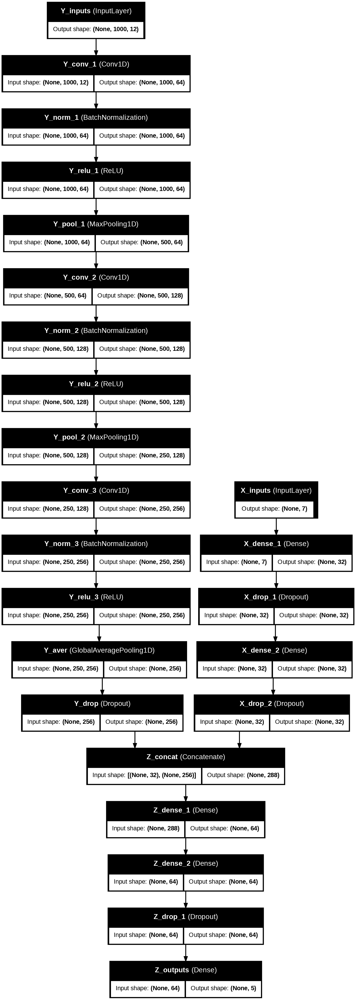

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(
    model02,
    to_file='model02_architecture.png',
    show_shapes=True,
    show_layer_names=True,
    rankdir='TB',  # Layout từ trái sang phải
    expand_nested=True,
    dpi=150
)


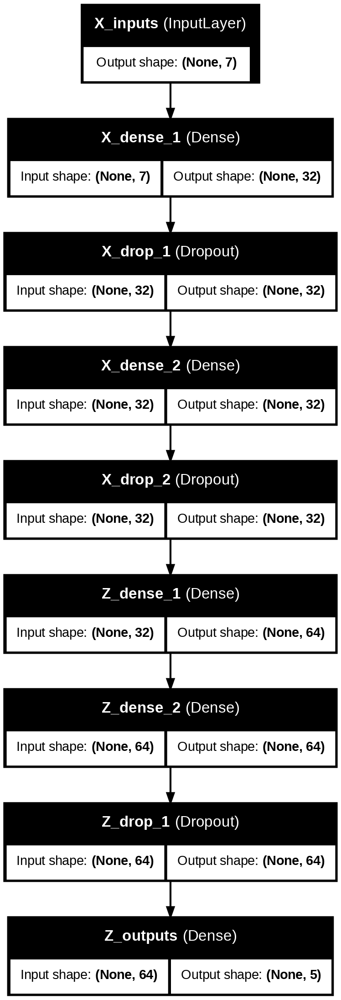

In [ ]:
plot_model(
    model01,
    to_file='model01_architecture.png',
    show_shapes=True,
    show_layer_names=True,
    rankdir='TB',  # Layout từ trái sang phải
    expand_nested=True,
    dpi=150
)

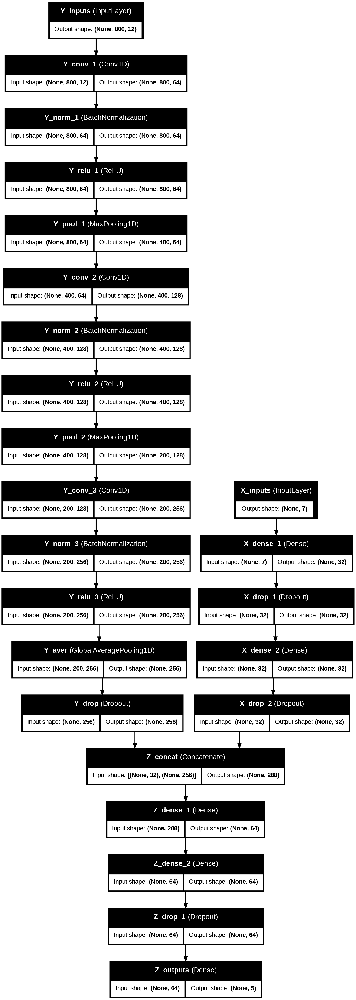

In [ ]:
plot_model(
    model03,
    to_file='model03_architecture.png',
    show_shapes=True,
    show_layer_names=True,
    rankdir='TB',  # Layout từ trái sang phải
    expand_nested=True,
    dpi=150
)